# Introduction

This analysis explores levels of press freedom worldwide and its relationship with government classifications (i.e. autocriacies vs democracies). The datasets utilised include the press freedom index from the Reporters Without Borders and several indicators of press freedom and government classification from the Vdem dataset. Following an overview and comparison of levels of press freedom at regional and sub-regional levels, the analysis will also explore its relationship with different government classifications and financial indicators such as GDP per Capita and FDI inflows. A classification model based on press freedom data and financial data will then be built to predict the government classification.

## Task 1: Data Collection, Cleaning, Feature Engineering

In [1]:
import pandas as pd
import numpy as np

df1 = pd.read_csv('2024.csv',delimiter=';')
df2 = pd.read_csv('2023.csv',delimiter = ';')
df3 = pd.read_csv('2022.csv',delimiter  = ';')

print(df1.columns,df2.columns,df3.columns)

Index(['ISO', 'Score', 'Rank', 'Political Context', 'Rank_Pol',
       'Economic Context', 'Rank_Eco', 'Legal Context', 'Rank_Leg',
       'Social Context', 'Rank_Soc', 'Safety', 'Rank_Saf', 'Situation', 'Zone',
       'Country_FR', 'Country_EN', 'Country_ES', 'Country_PT', 'Country_AR',
       'Country_FA', 'Year (N)', 'Rank N-1', 'Rank evolution', 'Score N-1',
       'Score evolution'],
      dtype='object') Index(['ISO', 'Score', 'Rank', 'Political Context', 'Rank_Pol',
       'Economic Context', 'Rank_Eco', 'Legal Context', 'Rank_Leg',
       'Social Context', 'Rank_Soc', 'Safety', 'Rank_Saf', 'Zone',
       'Country_FR', 'Country_EN', 'Country_ES', 'Country_PT', 'Country_AR',
       'Country_FA', 'Year (N)', 'Rank N-1', 'Rank evolution', 'Score N-1',
       'Score evolution'],
      dtype='object') Index(['ISO', 'Score', 'Rank', 'Political Context', 'Rank_Pol',
       'Economic Context', 'Rank_Eco', 'Legal Context', 'Rank_Leg',
       'Social Context', 'Rank_Soc', 'Safety', 'Rank_

All the column names, apart from "Score Evolution", "Situation","Country_PT"and "Score N-1" are present across the 3 datasets. I will visually inspect the the 3 dataframes to ensure that they are suitable for concatenation instead of merging because variables like "Score evolution", "Rank evolution", or "Situation" are not essential. The score/rank evolution for each country  can be calculated as long as the "Score" column is present. Also, "Situation" results from a binning of which guidelines are provided by the [RSF](https://rsf.org/en/index-methodologie-2022), so it can be recreated. The use of pd.concat will certainly produce blank values in these columns so they will be dropped, along with Country Names that are not in English.

In [2]:
df1.head()

,ISO,Score,Rank,Political Context,Rank_Pol,Economic Context,Rank_Eco,Legal Context,Rank_Leg,Social Context,...,Country_EN,Country_ES,Country_PT,Country_AR,Country_FA,Year (N),Rank N-1,Rank evolution,Score N-1,Score evolution
0,NOR,"91,89",1,"94,87",1,"89,84",1,"89,5",2,"90,48",...,Norway,Noruega,Noruega,النرويج,نروژ,2024,1,0,"95,18","-3,29"
1,DNK,"89,6",2,"94,11",2,"83,07",4,"88,82",3,"86,9",...,Denmark,Dinamarca,Dinamarca,الدنمارك,دانمارک,2024,3,1,"89,48","0,12"
2,SWE,"88,32",3,"91,03",4,"85,5",2,"90,16",1,"82,78",...,Sweden,Suecia,Suécia,السويد,سوئد,2024,4,1,"88,15","0,17"
3,NLD,"87,73",4,"88,41",7,"84,09",3,"87,59",4,"87,34",...,Netherlands,Países Bajos,Países Baixos,هولندا,هلند,2024,6,2,87,"0,73"
4,FIN,"86,55",5,"89,05",6,"80,9",5,"86,16",6,"84,52",...,Finland,Finlandia,Finlândia,فنلندا,فنلاند,2024,5,0,"87,94","-1,39"


In [3]:
df2.head()

,ISO,Score,Rank,Political Context,Rank_Pol,Economic Context,Rank_Eco,Legal Context,Rank_Leg,Social Context,...,Country_EN,Country_ES,Country_PT,Country_AR,Country_FA,Year (N),Rank N-1,Rank evolution,Score N-1,Score evolution
0,NOR,"95,18",1,"96,54",1,"92,46",1,"94,92",1,"95,98",...,Norway,Noruega,Noruega,النرويج,نروژ,2023,1,0,"92,65","2,53"
1,IRL,"89,91",2,"93,91",2,"82,11",7,"82,55",19,"94,03",...,Ireland,Irlanda,Irlanda,أيرلندا,ایرلند,2023,6,4,"88,3","1,61"
2,DNK,"89,48",3,"91,95",4,"85,17",4,"87,5",5,"87,78",...,Denmark,Dinamarca,Dinamarca,الدنمارك,دانمارک,2023,2,-1,"90,27","-0,79"
3,SWE,"88,15",4,"92,58",3,"86,08",3,"88,74",4,"88,64",...,Sweden,Suecia,Suécia,السويد,سوئد,2023,3,-1,"88,84","-0,69"
4,FIN,"87,94",5,"91,55",5,"83,8",5,"84,86",11,"89,17",...,Finland,Finlandia,Finlândia,فنلندا,فنلاند,2023,5,0,"88,42","-0,48"


In [4]:
df3.head()

,ISO,Score,Rank,Political Context,Rank_Pol,Economic Context,Rank_Eco,Legal Context,Rank_Leg,Social Context,...,Rank_Saf,Zone,Country_EN,Country_FR,Country_ES,Country_AR,Country_FA,Year (N),Rank N-1,Rank evolution
0,NOR,"92,65",1,"94,89",1,"90,38",1,"92,23",1,"93,71",...,11,Europe - Asie centrale,Norway,Norvège,Noruega,النرويج,نروژ,2022,1,0
1,DNK,"90,27",2,"94,34",2,"83,67",3,"89,18",4,"91,17",...,7,Europe - Asie centrale,Denmark,Danemark,Dinamarca,الدنمارك,دانمارک,2022,4,2
2,SWE,"88,84",3,"91,96",3,"87,66",2,"90,27",3,"90,18",...,32,Europe - Asie centrale,Sweden,Suède,Suecia,السويد,سوئد,2022,3,0
3,EST,"88,83",4,"91,11",5,"81,97",6,"87,87",5,90,...,6,Europe - Asie centrale,Estonia,Estonie,Estonia,إستونيا,استونی,2022,15,11
4,FIN,"88,42",5,"90,4",6,"82,03",5,"86,64",9,"90,77",...,10,Europe - Asie centrale,Finland,Finlande,Finlandia,فنلندا,فنلاند,2022,2,-3


The visual inspection of the dataframes confirms the points made in the previous paragraph, and it also shows formatting issues with some of the continuous variables which will lead them to be recognised as objects instead of floats. I will now proceded to concatenate the dataframes.I will then check for blank values and data types to see if additional data cleaning is needed.

In [5]:
press_freedom = pd.concat([df1,df2,df3])
press_freedom

,ISO,Score,Rank,Political Context,Rank_Pol,Economic Context,Rank_Eco,Legal Context,Rank_Leg,Social Context,...,Country_EN,Country_ES,Country_PT,Country_AR,Country_FA,Year (N),Rank N-1,Rank evolution,Score N-1,Score evolution
0,NOR,"91,89",1,"94,87",1,"89,84",1,"89,5",2,"90,48",...,Norway,Noruega,Noruega,النرويج,نروژ,2024,1,0,"95,18","-3,29"
1,DNK,"89,6",2,"94,11",2,"83,07",4,"88,82",3,"86,9",...,Denmark,Dinamarca,Dinamarca,الدنمارك,دانمارک,2024,3,1,"89,48","0,12"
2,SWE,"88,32",3,"91,03",4,"85,5",2,"90,16",1,"82,78",...,Sweden,Suecia,Suécia,السويد,سوئد,2024,4,1,"88,15","0,17"
3,NLD,"87,73",4,"88,41",7,"84,09",3,"87,59",4,"87,34",...,Netherlands,Países Bajos,Países Baixos,هولندا,هلند,2024,6,2,87,"0,73"
4,FIN,"86,55",5,"89,05",6,"80,9",5,"86,16",6,"84,52",...,Finland,Finlandia,Finlândia,فنلندا,فنلاند,2024,5,0,"87,94","-1,39"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
175,MMR,"25,03",176,"40,4",149,"29,25",155,"20,18",178,"30,67",...,Myanmar,Birmania,NaN,بورما,برمه,2022,140,-36,NaN,NaN
176,TKM,"25,01",177,25,178,"11,73",179,"29,61",169,23,...,Turkmenistan,Turkmenistán,NaN,تركمانستان,ترکمنستان,2022,178,1,NaN,NaN
177,IRN,"23,22",178,"30,71",175,"21,32",171,"26,71",173,"23,78",...,Islamic Republic of Iran,Irán,NaN,إيران,ایران,2022,174,-4,NaN,NaN
178,ERI,"19,62",179,"22,22",180,"19,73",174,"25,15",174,"19,67",...,Eritrea,Eritrea,NaN,إريتريا,اریتره,2022,180,1,NaN,NaN


In [6]:
press_freedom.isnull().sum()

ISO                    0
Score                  0
Rank                   0
Political Context      0
Rank_Pol               0
Economic Context       0
Rank_Eco               0
Legal Context          0
Rank_Leg               0
Social Context         0
Rank_Soc               0
Safety                 0
Rank_Saf               0
Situation            360
Zone                   0
Country_FR             0
Country_EN             0
Country_ES             0
Country_PT           180
Country_AR             0
Country_FA             0
Year (N)               0
Rank N-1               0
Rank evolution         0
Score N-1            180
Score evolution      180
dtype: int64

In [7]:
press_freedom.dtypes

ISO                  object
Score                object
Rank                  int64
Political Context    object
Rank_Pol              int64
Economic Context     object
Rank_Eco              int64
Legal Context        object
Rank_Leg              int64
Social Context       object
Rank_Soc              int64
Safety               object
Rank_Saf              int64
Situation            object
Zone                 object
Country_FR           object
Country_EN           object
Country_ES           object
Country_PT           object
Country_AR           object
Country_FA           object
Year (N)              int64
Rank N-1              int64
Rank evolution        int64
Score N-1            object
Score evolution      object
dtype: object

As anticipated, the inpection of null values after the concatenation shows a considerable amout of blank values in the features that I discussed earlier. Similarly, the inspection on the data types confirms that formatting issues need to be addressed to allow the correct processing of continouus variables. I will now address the formatting issues by replacing the ',' with '.' in the continous variables and convert them into floats. A for loop will be used for efficiency.

In [8]:
for col in ['Score', 'Political Context', 'Economic Context', 'Legal Context', 'Social Context', 'Safety']:
    press_freedom[col] = press_freedom[col].str.replace(',', '.').astype(float)

I will also drop all unnecessary columns and inspect the data types to ensure the changes have taken place and the head of the dataframe for further visual inspection

In [9]:
press_freedom.drop(['Rank','Rank_Pol','Rank_Eco','Rank_Leg','Rank_Soc','Rank_Saf','Rank N-1','Rank evolution','Score N-1','Score evolution','Country_FR','Country_ES','Country_PT','Country_AR','Country_FA'], axis = 1, inplace = True)

In [10]:
press_freedom.dtypes

ISO                   object
Score                float64
Political Context    float64
Economic Context     float64
Legal Context        float64
Social Context       float64
Safety               float64
Situation             object
Zone                  object
Country_EN            object
Year (N)               int64
dtype: object

In [11]:
press_freedom.head()

,ISO,Score,Political Context,Economic Context,Legal Context,Social Context,Safety,Situation,Zone,Country_EN,Year (N)
0,NOR,91.89,94.87,89.84,89.50,90.48,94.74,Bonne situation,UE Balkans,Norway,2024
1,DNK,89.60,94.11,83.07,88.82,86.90,95.09,Bonne situation,UE Balkans,Denmark,2024
2,SWE,88.32,91.03,85.50,90.16,82.78,92.12,Bonne situation,UE Balkans,Sweden,2024
3,NLD,87.73,88.41,84.09,87.59,87.34,91.23,Bonne situation,UE Balkans,Netherlands,2024
4,FIN,86.55,89.05,80.90,86.16,84.52,92.13,Bonne situation,UE Balkans,Finland,2024


The data types have been successfully converted and the numerical columns are now recognised as floats. However, "Situation" a considerable amount of null values and the terminology is in French. Based on the guidance from the [RSF](https://rsf.org/en/index-methodologie-2022), I will now loop through each "Score" and assign a label based on the range of the "Score".

In [12]:
press_freedom['Situation Adjusted'] = ''

for index, row in press_freedom.iterrows():
    score = row['Score']
    if score > 85:
        press_freedom.at[index, 'Situation Adjusted'] = 'Good'
    elif 70 <= score <= 85:
        press_freedom.at[index, 'Situation Adjusted'] = 'Satisfactory'
    elif 55 <= score <= 70:
        press_freedom.at[index, 'Situation Adjusted'] = 'Problematic'
    elif 40 <= score <= 55:
        press_freedom.at[index, 'Situation Adjusted'] = 'Difficult'
    else:
        press_freedom.at[index, 'Situation Adjusted'] = 'Very Serious'

press_freedom.drop('Situation',axis =1, inplace = True)
press_freedom['Situation'] = press_freedom['Situation Adjusted']
press_freedom.drop('Situation Adjusted',axis = 1, inplace =True)

In [13]:
print(f'the number of null values is {press_freedom.Situation.isnull().sum()}')
print(press_freedom.Situation.value_counts())

the number of null values is 0
Situation
Problematic     186
Difficult       126
Satisfactory    120
Very Serious     84
Good             24
Name: count, dtype: int64


The loop successfully ensured the appropriate labeling for the "Situation" variable. I will now inspect the "Zone" variable to ensure its suitability to perform the analysis across World Regions and Sub-Regions.

In [14]:
press_freedom['Zone'].unique()

array(['UE Balkans', 'Amériques', 'Asie-Pacifique', 'EEAC', 'Afrique',
       'MENA', 'Europe - Asie centrale', 'Maghreb - Moyen-Orient'],
      dtype=object)

The "Zone" feature is inadequate, as it is in French and it is also limiting as there is no Subregional data. I will load the [UNSD data](https://unstats.un.org/unsd/methodology/m49/) with regions and sub-regions and merge it with the press_freedom dataframe using a left join on the ISO 3 code, retaining all press_freedom data and adding relevant UNSD data.

In [15]:
iso_regions = pd.read_csv('UNSD.csv', delimiter=';')
iso_regions

,Global Code,Global Name,Region Code,Region Name,Sub-region Code,Sub-region Name,Intermediate Region Code,Intermediate Region Name,Country or Area,M49 Code,ISO-alpha2 Code,ISO-alpha3 Code,Least Developed Countries (LDC),Land Locked Developing Countries (LLDC),Small Island Developing States (SIDS)
0,1,World,2.0,Africa,15.0,Northern Africa,NaN,NaN,Algeria,12,DZ,DZA,NaN,NaN,NaN
1,1,World,2.0,Africa,15.0,Northern Africa,NaN,NaN,Egypt,818,EG,EGY,NaN,NaN,NaN
2,1,World,2.0,Africa,15.0,Northern Africa,NaN,NaN,Libya,434,LY,LBY,NaN,NaN,NaN
3,1,World,2.0,Africa,15.0,Northern Africa,NaN,NaN,Morocco,504,MA,MAR,NaN,NaN,NaN
4,1,World,2.0,Africa,15.0,Northern Africa,NaN,NaN,Sudan,729,SD,SDN,x,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
243,1,World,9.0,Oceania,61.0,Polynesia,NaN,NaN,Samoa,882,WS,WSM,NaN,NaN,x
244,1,World,9.0,Oceania,61.0,Polynesia,NaN,NaN,Tokelau,772,TK,TKL,NaN,NaN,NaN
245,1,World,9.0,Oceania,61.0,Polynesia,NaN,NaN,Tonga,776,TO,TON,NaN,NaN,x
246,1,World,9.0,Oceania,61.0,Polynesia,NaN,NaN,Tuvalu,798,TV,TUV,x,NaN,x


Before performing the merge, I need to make sure that the name of the ISO columns are the same, I will then perform the merge and check for blank values.

In [16]:
iso_regions['ISO'] = iso_regions['ISO-alpha3 Code']
press_freedom = pd.merge(press_freedom, iso_regions[['Region Name', 'Sub-region Name', 'ISO']], on='ISO', how='left')
press_freedom.isnull().sum()

ISO                   0
Score                 0
Political Context     0
Economic Context      0
Legal Context         0
Social Context        0
Safety                0
Zone                  0
Country_EN            0
Year (N)              0
Situation             0
Region Name          12
Sub-region Name      12
dtype: int64

The merge produced 12 blank rows in Region and Sub-region names. I will identify these countries by creating a dataframe of null values in Region and Sub-region names and extracting the unique country names.

In [17]:
null_values = press_freedom[press_freedom['Region Name'].isnull() | press_freedom['Sub-region Name'].isnull()]
countries_without_values = null_values['Country_EN'].unique()
print(countries_without_values)

['Taiwan' 'OECS' 'Kosovo' 'Northern Cyprus' 'Cyprus North']


Whilst I will handle the null values in further steps, this step shows that there are naming inconsistencies across years for some countries. To address them, I will standardize country names. First, I will extract unique country names and identify those with different names over the years.

In [18]:
pd.set_option('display.max_rows', None)

country_name_check = press_freedom['Country_EN'].unique()
np.sort(country_name_check)

array(['Afghanistan', 'Albania', 'Algeria', 'Andorra', 'Angola',
       'Argentina', 'Armenia', 'Australia', 'Austria', 'Azerbaijan',
       'Bahrain', 'Bangladesh', 'Belarus', 'Belgium', 'Belize', 'Benin',
       'Bhutan', 'Bolivia', 'Bosnia and Herzegovina',
       'Bosnia-Herzegovina', 'Botswana', 'Brazil', 'Brunei',
       'Brunei Darussalam', 'Bulgaria', 'Burkina Faso', 'Burundi',
       'Cabo Verde', 'Cambodia', 'Cameroon', 'Canada', 'Cape Verde',
       'Central African Republic', 'Chad', 'Chile', 'China', 'Colombia',
       'Comoros', 'Congo', 'Congo-Brazzaville', 'Costa Rica', 'Croatia',
       'Cuba', 'Cyprus', 'Cyprus North', 'Czech Republic', 'Czechia',
       "Côte d'Ivoire", 'DR Congo',
       "Democratic People's Republic of Korea", 'Denmark', 'Djibouti',
       'Dominican Republic', 'East Timor', 'Ecuador', 'Egypt',
       'El Salvador', 'Equatorial Guinea', 'Eritrea', 'Estonia',
       'Eswatini', 'Ethiopia', 'Fiji', 'Finland', 'France', 'Gabon',
       'Gambia', 'Geor

And now I will standardise each country name by using the .replace method

In [19]:
press_freedom['Country_EN'] = press_freedom['Country_EN'].replace({'Bosnia-Herzegovina':'Bosnia and Herzegovina','Congo-Brazzaville':'Congo','Czechia':'Czech Republic','Islamic Republic of Iran':'Iran',"Lao People's Democratic Republic": 'Laos','Morocco / Western Sahara ':'Morocco',"Democratic People's Republic of Korea": 'North Korea','Russian Federation':'Russia','Syrian Arab Republic':'Syria','The Democratic Republic Of The Congo':'DR Congo','Türkiye':'Turkey','Cabo Verde':'Cape Verde',"Côte d'Ivoire":'Ivory Coast'})

Now that the Country Names are standardised, I will now merge additional press freedom data from the [VDEM Index](https://www.v-dem.net/data/the-v-dem-dataset/), which includes over 140 indicators on democracy, including press freedom. Before merging, I will standardize the "Year (N)" column name to match both ISO code and Year.

In [20]:
press_freedom['Year'] = press_freedom['Year (N)']
press_freedom.drop('Year (N)',axis = 1,inplace = True)

Now I will load the dataset

In [28]:
vdem = pd.read_csv('vdem.csv')
vdem.head()

,country_name,year,v2csreprss_ord,v2mecenefm_ord,v2mecenefi_ord,v2mecrit_ord,v2merange_ord,v2meharjrn_ord,v2meslfcen_ord,v2mebias_ord,v2mecorrpt_ord,v2x_regime,ISO
0,Mexico,2021,3,2,3,2,3,2,2,4,3,2,MEX
1,Mexico,2022,3,2,3,2,3,2,2,4,3,2,MEX
2,Mexico,2023,3,2,3,2,2,2,2,3,3,2,MEX
3,Suriname,2021,4,3,3,2,3,2,2,4,3,2,SUR
4,Suriname,2022,4,3,3,2,3,2,2,4,3,2,SUR


I will slice the dataset to include data from 2021 to 2023, the most recent from the V-Dem Institute. For merging, I will re-map these years to align with the press_freedom dataframe (up to 2024), highlighting this one-year lag as a limitation. Relevant columns will be renamed to match the main dataframe.

In [29]:
vdem['year'].unique()

array([2021, 2022, 2023], dtype=int64)

In [30]:
vdem['year'] = vdem['year'].replace({2021:2022,2022:2023,2023:2024})

Before merging, I will rename columns for clarity using the [V-Dem Codebook](https://v-dem.net/documents/38/V-Dem_Codebook_v14.pdf). After ensuring key matches, I will merge the datasets and check for null values.

In [31]:
vdem.rename(columns={
    'v2csreprss_ord': 'CSO Repression',
    'v2mecenefm_ord': 'Gov Censorship effort on media',
    'v2mecenefi_ord': 'Gov Censorship Internet',
    'v2mecrit_ord': 'Media able to criticise government',
    'v2meharjrn_ord': 'Harassment of journalists',
    'v2merange_ord': 'Multiple political perspectives represented in media',
    'v2meslfcen_ord': 'Level of media self-censorship',
    'v2mebias_ord': 'Media bias',
    'v2mecorrpt_ord': 'Media corruption level',
    'v2x_regime': 'Regime Score',
    'year':'Year'
}, inplace=True)

In [32]:
press_freedom['Country'] = press_freedom['Country_EN']
press_freedom.drop('Country_EN',axis = 1, inplace = True)

In [33]:
press_freedom = pd.merge(press_freedom,vdem,on = ['ISO','Year'],how = 'left')
press_freedom.isnull().sum()

ISO                                                      0
Score                                                    0
Political Context                                        0
Economic Context                                         0
Legal Context                                            0
Social Context                                           0
Safety                                                   0
Zone                                                     0
Situation                                                0
Region Name                                             12
Sub-region Name                                         12
Year                                                     0
Country                                                  0
country_name                                            25
CSO Repression                                          25
Gov Censorship effort on media                          25
Gov Censorship Internet                                 

The merge produced additional null values. Since V-Dem variables are ordinal,I'll drop null values. Similarly, I'll drop *those* countries without  matching regions (Kosovo, Taiwan, Northern Cyprus, OECS) due to their controversial status and potential to generate further missing values when merging financial data.

In [34]:
press_freedom.dropna(inplace = True)

In [35]:
press_freedom.shape

(510, 24)

With the ordinal press freedom variables from the V-Dem index merged, I will label columns for ease of visualization. The category meanings are from the V-Dem Codebook. The Regime Score (ordinal), classifying countries by democracy levels, will be the target variable for prediction in the classification task.

In [36]:
mappings = {
            'CSO Repression':{0:'Severe',1:'Substantial',2:'Moderate',3:'Weak',4:'Absent'},
            'Gov Censorship effort on media': {0:'Direct and Routine',1:'Indirect and Routine',2:'Direct but sensitive issues only',3:'Indirect but sensitive issues only',4:'Rare, exceptional and punished'},
            'Gov Censorship Internet':{0:'Total Internet Block',1:'Partial block, Circumventable',2:'Selective Site Blocking',3:'Mostly Unrestricted Access'},
            'Media able to criticise government':{0: 'No Criticism',1: 'Marginal Criticism',2: 'Mixed Criticism',3: 'Broad Criticism'},
            'Harassment of journalists':{0: 'Journalism Suppressed',1: 'Regular Harassment, Cessation',2: 'Mixed Freedom and Harassment',3: 'Harassment Rare, Punished',4: 'No Harassment'},
            'Multiple political perspectives represented in media':{0: "Government Perspective Only",1: "Limited Perspectives",2: "Broad but Incomplete Perspectives",3: "All Important Perspectives Represented"},
            'Media bias':{0: 'No or Biased Official Coverage',1: 'Negative Opposition Coverage',2: 'Partial Impartial Coverage',3: 'Biased Towards Government',4: 'Impartial and Proportional Coverage'},
            'Media corruption level': {0: 'Government-Directed Media',1: 'Routine Payment for Coverage',2: 'Common Payment for Coverage', 3: 'Occasional Unpunished Alterations', 4: 'Rare Alterations, Punished'},
            'Regime Score' : {0:'Closed Autocracy',1:'Electoral Autocracy',2:'Electoral Democracy',3:'Liberal Democracy'},
            'Level of media self-censorship':{0: 'Complete and thorough self-censorship',1: 'Common but incomplete self-censorship',2: 'Self-censorship on highly sensitive political issues only',3: 'Little or no self-censorship among journalists'}
}

for feature, map_dict in mappings.items():
    press_freedom[f'{feature} Label'] = press_freedom[feature].map(map_dict)

In [37]:
press_freedom.columns

Index(['ISO', 'Score', 'Political Context', 'Economic Context',
       'Legal Context', 'Social Context', 'Safety', 'Zone', 'Situation',
       'Region Name', 'Sub-region Name', 'Year', 'Country', 'country_name',
       'CSO Repression', 'Gov Censorship effort on media',
       'Gov Censorship Internet', 'Media able to criticise government',
       'Multiple political perspectives represented in media',
       'Harassment of journalists', 'Level of media self-censorship',
       'Media bias', 'Media corruption level', 'Regime Score',
       'CSO Repression Label', 'Gov Censorship effort on media Label',
       'Gov Censorship Internet Label',
       'Media able to criticise government Label',
       'Harassment of journalists Label',
       'Multiple political perspectives represented in media Label',
       'Media bias Label', 'Media corruption level Label',
       'Regime Score Label', 'Level of media self-censorship Label'],
      dtype='object')

In [38]:
press_freedom.drop('country_name',axis =1 , inplace = True)

I will now merge financial information for countries across the years. This step which will be functional to compare, contrast and analyse levels of press freedom, regime classification and their relationship with key financial indicators such as GDP per capita and Foreign Investment. The data is from the [World Bank](https://data.worldbank.org/).

In [39]:
financial_data = pd.read_csv('Financial  data.csv')
financial_data.head()

,Time,Country Name,ISO,FDI inflows,GDP per capita
0,2021,Chad,TCD,7.051008e+08,685.690315
1,2021,Nigeria,NGA,3.313210e+09,2065.774410
2,2020,Chad,TCD,5.576925e+08,643.772216
3,2020,Nigeria,NGA,2.385278e+09,2074.613747
4,2021,Lesotho,LSO,-1.237219e+07,1029.506189


As financial data lags two years behind, I will replace the years to match with the years in the main dataframe and use the data as "most recent data" for the purpose of this analysis. This is a limitation of the analysis.

In [40]:
financial_data['Time'] = financial_data['Time'].replace({2020:2022,2021:2023,2022:2024})
financial_data['Year'] = financial_data['Time']
financial_data.drop(['Time'],axis =1,inplace = True)

I will now execute the merge and check if additional null values are produced after the merge

In [41]:
press_freedom = pd.merge(press_freedom,financial_data, on = ['ISO','Year'],how ='left',indicator = True)

In [42]:
press_freedom._merge.value_counts()

_merge
both          510
left_only       0
right_only      0
Name: count, dtype: int64

In [43]:
press_freedom.isnull().sum()

ISO                                                            0
Score                                                          0
Political Context                                              0
Economic Context                                               0
Legal Context                                                  0
Social Context                                                 0
Safety                                                         0
Zone                                                           0
Situation                                                      0
Region Name                                                    0
Sub-region Name                                                0
Year                                                           0
Country                                                        0
CSO Repression                                                 0
Gov Censorship effort on media                                 0
Gov Censorship Internet  

The merge produced additional null values, indicating missing data in the World Bank dataset. I will verify financial data for all countries across different years to identify those with complete data and the extent of gaps. Using the pivot_table method, I will display the count of GDP per capita and FDI investments by year to assess data completeness for each country before discussing the strategy to handle null values.


In [44]:
pd.set_option('display.max_rows', None)

pivot_table_gdp = press_freedom.pivot_table(index='Country', columns='Year', values='GDP per capita', aggfunc='count', fill_value=0)
pivot_table_gdp

Year,2022,2023,2024
Country,,,
Afghanistan,1,1,0
Albania,1,1,1
Algeria,1,1,1
Angola,1,1,1
Argentina,1,1,1
Armenia,1,1,1
Australia,1,1,1
Austria,1,1,1
Azerbaijan,1,1,1


In [45]:
pivot_table_fdi = press_freedom.pivot_table(index='Country', columns='Year', values='FDI inflows', aggfunc='count', fill_value=0)
pivot_table_fdi

Year,2022,2023,2024
Country,,,
Afghanistan,1,1,0
Albania,1,1,1
Algeria,1,1,1
Angola,1,1,1
Argentina,1,1,1
Armenia,1,1,1
Australia,1,1,1
Austria,1,1,1
Azerbaijan,1,1,1


In [46]:
press_freedom.columns

Index(['ISO', 'Score', 'Political Context', 'Economic Context',
       'Legal Context', 'Social Context', 'Safety', 'Zone', 'Situation',
       'Region Name', 'Sub-region Name', 'Year', 'Country', 'CSO Repression',
       'Gov Censorship effort on media', 'Gov Censorship Internet',
       'Media able to criticise government',
       'Multiple political perspectives represented in media',
       'Harassment of journalists', 'Level of media self-censorship',
       'Media bias', 'Media corruption level', 'Regime Score',
       'CSO Repression Label', 'Gov Censorship effort on media Label',
       'Gov Censorship Internet Label',
       'Media able to criticise government Label',
       'Harassment of journalists Label',
       'Multiple political perspectives represented in media Label',
       'Media bias Label', 'Media corruption level Label',
       'Regime Score Label', 'Level of media self-censorship Label',
       'Country Name', 'FDI inflows', 'GDP per capita', '_merge'],
      dt

Few countries (as Cuba, North Korea, Eritrea, Syria, Yemen),lack financial data entirely. To avoid dropping these data, I will:

- Fill missing values using the mean from other years if the country has partial data.
  
- Use the sub-region median to impute values for countries with no financial data, ***minimizing the impact of outliers***.

I will now calculate country means and sub-regional medians for GDP per capita and FDI inflows to fill missing values.

In [47]:
country_means_gdp = press_freedom.groupby('Country')['GDP per capita'].transform('mean')
country_means_fdi = press_freedom.groupby('Country')['FDI inflows'].transform('mean')
subregion_median_gdp = press_freedom.groupby(['Year', 'Sub-region Name'])['GDP per capita'].transform('median')
subregion_median_fdi = press_freedom.groupby(['Year', 'Sub-region Name'])['FDI inflows'].transform('median')

I will now fill the missing values for GDP per capita and FDI inflows using the country means first, then, if no country data is available subregional medians will be used.

In [48]:
press_freedom['GDP per capita'] = press_freedom['GDP per capita'].fillna(country_means_gdp).fillna(subregion_median_gdp)
press_freedom['FDI inflows'] = press_freedom['FDI inflows'].fillna(country_means_fdi).fillna(subregion_median_fdi)

In [49]:
press_freedom.isnull().sum()

ISO                                                           0
Score                                                         0
Political Context                                             0
Economic Context                                              0
Legal Context                                                 0
Social Context                                                0
Safety                                                        0
Zone                                                          0
Situation                                                     0
Region Name                                                   0
Sub-region Name                                               0
Year                                                          0
Country                                                       0
CSO Repression                                                0
Gov Censorship effort on media                                0
Gov Censorship Internet                 

In [50]:
press_freedom.shape

(510, 37)

In [51]:
press_freedom.head()

,ISO,Score,Political Context,Economic Context,Legal Context,Social Context,Safety,Zone,Situation,Region Name,...,Harassment of journalists Label,Multiple political perspectives represented in media Label,Media bias Label,Media corruption level Label,Regime Score Label,Level of media self-censorship Label,Country Name,FDI inflows,GDP per capita,_merge
0,NOR,91.89,94.87,89.84,89.50,90.48,94.74,UE Balkans,Good,Europe,...,No Harassment,All Important Perspectives Represented,Impartial and Proportional Coverage,"Rare Alterations, Punished",Liberal Democracy,Little or no self-censorship among journalists,Norway,1.290380e+10,108729.18690,both
1,DNK,89.60,94.11,83.07,88.82,86.90,95.09,UE Balkans,Good,Europe,...,No Harassment,All Important Perspectives Represented,Impartial and Proportional Coverage,"Rare Alterations, Punished",Liberal Democracy,Little or no self-censorship among journalists,Denmark,3.421274e+10,67790.05399,both
2,SWE,88.32,91.03,85.50,90.16,82.78,92.12,UE Balkans,Good,Europe,...,"Harassment Rare, Punished",All Important Perspectives Represented,Impartial and Proportional Coverage,"Rare Alterations, Punished",Liberal Democracy,Little or no self-censorship among journalists,Sweden,4.588178e+10,56424.28470,both
3,NLD,87.73,88.41,84.09,87.59,87.34,91.23,UE Balkans,Good,Europe,...,"Harassment Rare, Punished",All Important Perspectives Represented,Impartial and Proportional Coverage,"Rare Alterations, Punished",Liberal Democracy,Self-censorship on highly sensitive political ...,Netherlands,-1.207602e+10,57025.01246,both
4,FIN,86.55,89.05,80.90,86.16,84.52,92.13,UE Balkans,Good,Europe,...,No Harassment,All Important Perspectives Represented,Impartial and Proportional Coverage,"Rare Alterations, Punished",Liberal Democracy,Little or no self-censorship among journalists,Finland,1.336366e+10,50871.93045,both


The dataset is now free of null values and includes data from relevant sources. I will remove the redundant "Zone" and "_merge columns". The final dataframe contains 510 rows and 35 columns with country information on democracy levels, press freedom, and economic data across 3 years.

In [52]:
press_freedom.drop(['Zone','_merge'], axis =1, inplace = True)

In [53]:
press_freedom.shape

(510, 35)

# Task 2: Data Analysis

## Question 1: Discuss global trends of press freedom in the world and how they have changed over the timespan of 2022 - 2024

For ease of analysis and year on year comparisons I will now slice the dataframe into variables containing data for each year. I will then store the continous features in one variable and produce the descriptives for each year by using for loops. I will then produce the relevant graphs and discuss key changes

In [54]:
pf_2022 = press_freedom[press_freedom['Year'] == 2022]
pf_2023 = press_freedom[press_freedom['Year'] == 2023]
pf_2024 = press_freedom[press_freedom['Year'] == 2024]

continuous_features = ['Score', 'Political Context', 'Economic Context', 'Legal Context', 'Social Context', 'Safety']
for year_data in [pf_2022, pf_2023, pf_2024]:
    print(year_data[continuous_features].describe())

            Score  Political Context  Economic Context  Legal Context  \
count  170.000000         170.000000        170.000000     170.000000   
mean    57.675588          56.541176         44.734235      62.154000   
std     17.386901          17.406283         16.946740      18.295169   
min     13.920000          22.220000          0.000000      15.790000   
25%     45.000000          43.085000         32.650000      50.385000   
50%     58.490000          55.050000         41.785000      64.380000   
75%     70.877500          70.127500         54.750000      77.287500   
max     92.650000          94.890000         90.380000      92.230000   

       Social Context      Safety  
count      170.000000  170.000000  
mean        66.015000   58.932294  
std         18.136197   24.244934  
min         12.000000    4.630000  
25%         53.877500   38.752500  
50%         67.620000   63.980000  
75%         81.067500   78.022500  
max         95.000000   95.580000  
            Score 

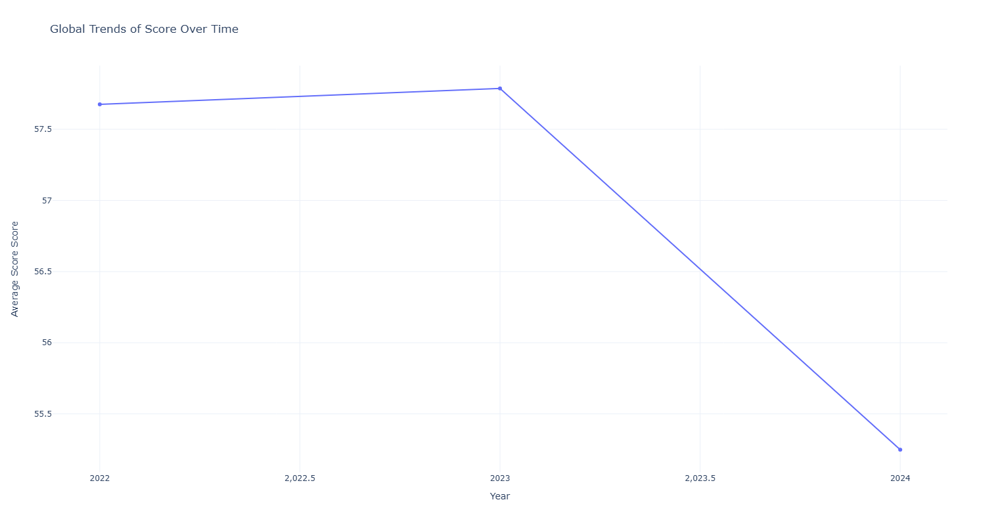

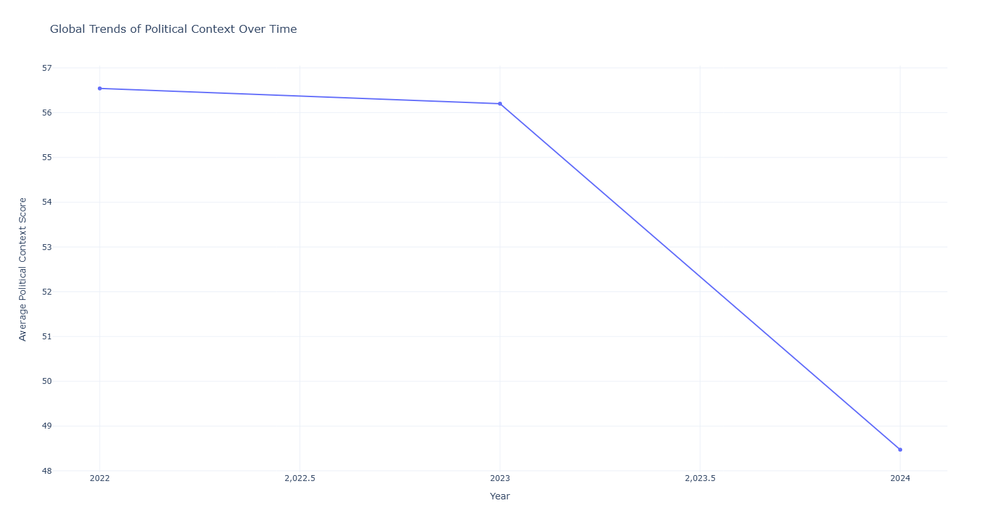

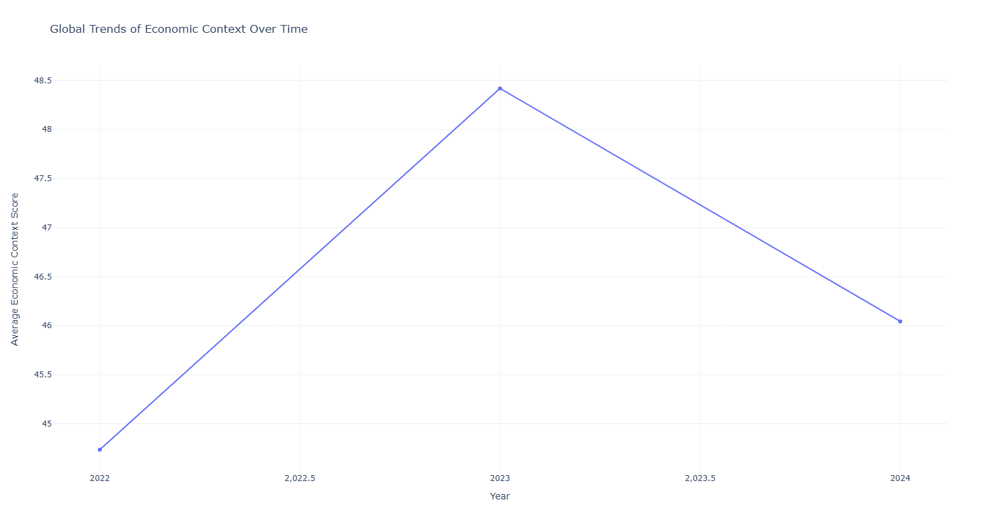

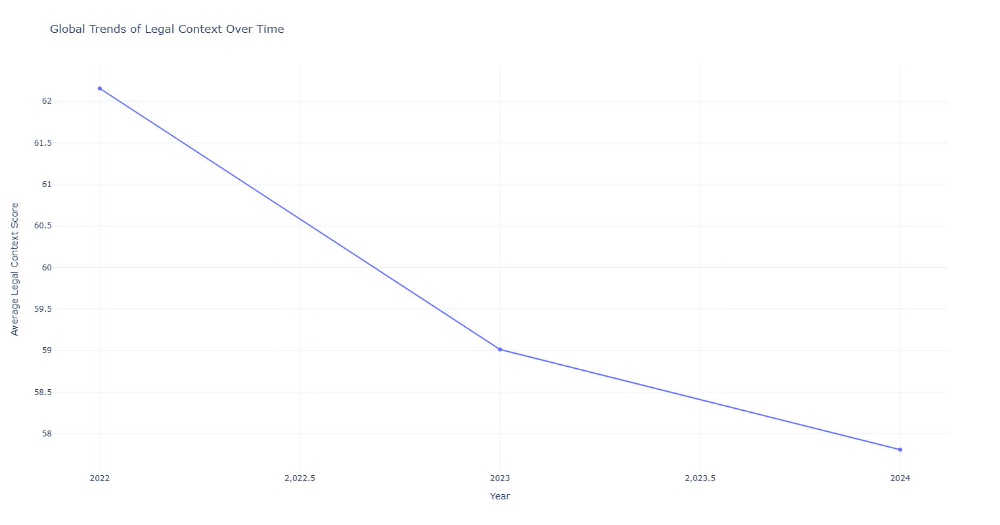

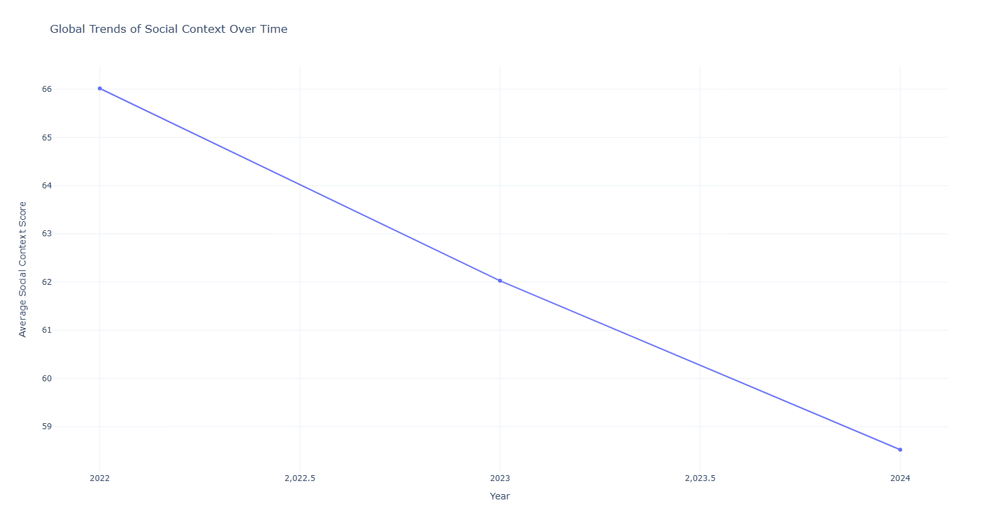

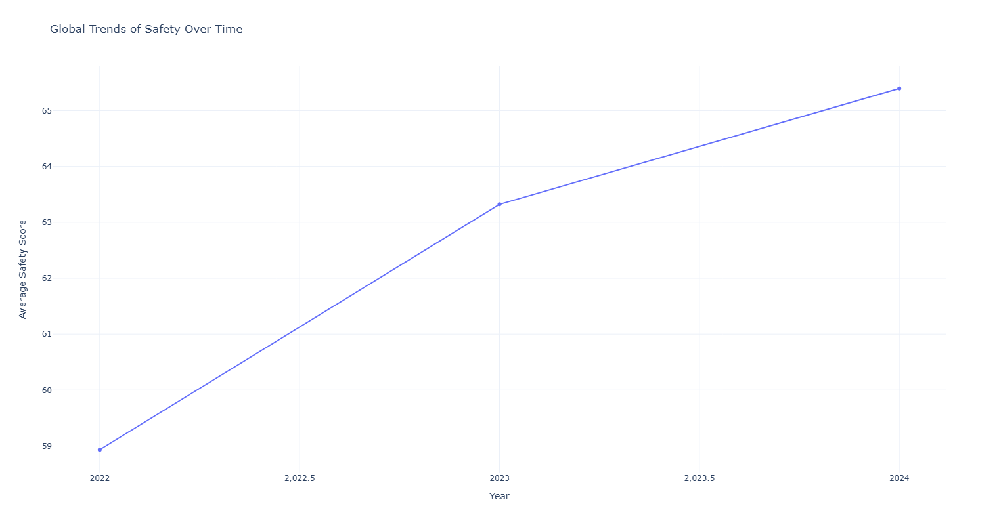

In [55]:
import plotly.express as px
for feature in continuous_features:
    trends = press_freedom.groupby('Year')[feature].mean().reset_index()
    fig = px.line(trends, x='Year', y=feature,
                  title=f'Global Trends of {feature} Over Time',
                  labels={feature: f'Average {feature} Score'},
                  markers=True)
    fig.update_layout(template='plotly_white', width=1000, height=800)
    fig.show()

***Overall Press Freedom Score:***

In terms of the Press Freedom score, we see some important fluctuations. Within each year, standard deviations ranging between 17.39 in 2022 and 18.41 in 2024 suggest that press freedom substantially varies among countries, pointing at global disparities. From the graphs, we notice a minimal increase in overall levels of press freedom between 2022 and 2023 and then a sharp decrease between 2023 and 2024. In essence, press freedom is declining across the globe. A higher standard deviation for 2024 indicates increasing disparity, suggesting a widening gap between more and less liberal countries

***Political Context:***

The political context for the press remained relatively stable between 2022 and 2023, with a marginal decrease and high standard deviation, indicating disparity among countries. However, from 2023 to 2024, we see a sharp decline from 56.20 to 48.47, with the standard deviation increasing to 20.67, suggesting a worsening political environment for journalists globally. This decline may be due to the rise of AI and fake news, leading to more reporting restrictions, and increased government propaganda and news manipulation. The 2023 World Press Freedom Index highlights how AI-generated disinformation and propaganda have significantly impacted press freedom, nurturing a more hostile environment for journalists. [(Global Investigative Journalism Network, 2023)](https://gijn.org/stories/2023-world-press-freedom-index-journalism-under-threat-from-fake-content-industry/).

***Economic Context:***

As far as the Economic Context for the press, there was a sharp improvement from 2022 to 2023, but a decline in 2024. However, the decline did not drop to 2022 levels or lower, so the economic context for the press has overall improved between 2022 and 2024

***Legal Context:***

The legal context also shows a sharp year-on-year decline between 2022 and 2024 and an increase in variability. If in 2022 the mean score was 62.15 with a standard deviation of 18.3, in 2024 we see a drop to a mean of 57.81 with a standard deviation of 19.11. This score goes hand-in-hand with the general political context and reflects increasing governmental influence and legal restrictions on journalism in general. 

***Social Context:***

The social context for press freedom has deteriorated, with scores dropping from 66.02 in 2022 to 58.52. This decline reflects an increased distrust towards governments using the media for political agendas. It can be suggested that the downtrend worsened before this data, during the pandemic, when public distrust towards the press (and scientists too) surged, due to how the virus was instrumentalized from governments to pursue political goals  (Harvard T.H. Chan School of Public Health,2021)

***Safety:***

Despite challenges in other scores, the safety of journalists has shown a considerable improvement over the years. In fact, from a score of 58.93 in 2022, 2024 records 65.4. As a general trend, this indicates less violence against journalists, however, high levels of standard deviation (24.65) here suggest that the disparity among countries in journalist safety has widened.

## Question 2: Compare press freedom among world regions and subregions.

To answer this question first, I will aggregate press freedom scores by region/subregion and year, then convert the data from the wide format produced by pivot tables to a long format suitable for Plotly by using the .melt method. I will then create line and bar charts to visualize regional and subregional trends.

In [56]:
press_freedom_by_region = press_freedom.pivot_table(index='Region Name', columns='Year', values='Score', aggfunc='mean').sort_values(by=2024, ascending=False)
press_freedom_by_region

Year,2022,2023,2024
Region Name,,,
Europe,72.942564,74.264103,73.054103
Oceania,70.220000,72.340000,70.097500
Americas,60.708846,58.830769,56.505385
Africa,55.760755,55.561132,53.948113
Asia,44.697083,45.080208,40.298125


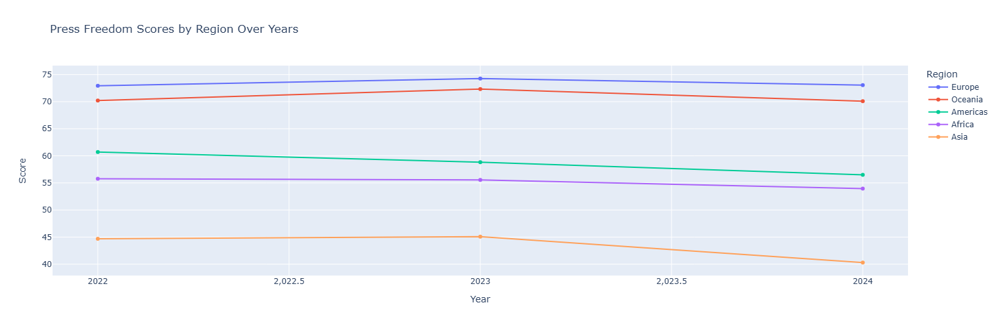

In [57]:
press_freedom_by_region = press_freedom_by_region.reset_index().melt(id_vars=['Region Name'], var_name='Year', value_name='Score')
fig_line = px.line(press_freedom_by_region, x='Year', y='Score', color='Region Name', markers=True, title='Press Freedom Scores by Region Over Years')
fig_line.update_layout(xaxis_title='Year', yaxis_title='Score', legend_title='Region', width=1000, height=500)
fig_line.show()

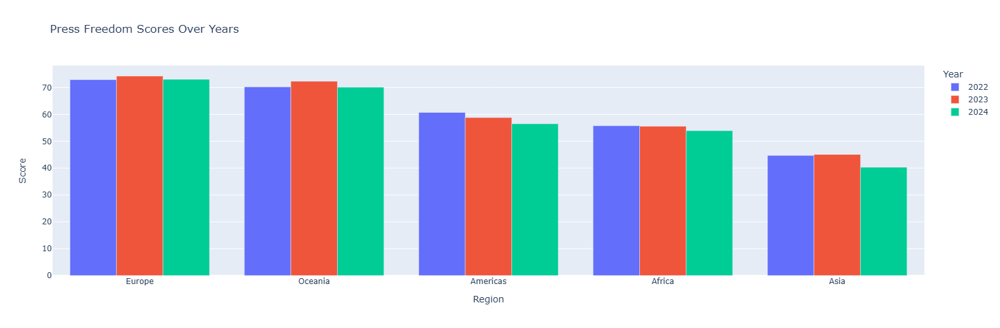

In [58]:
fig_bar = px.bar(press_freedom_by_region, x='Region Name', y='Score', color='Year', barmode='group', title='Press Freedom Scores Over Years')
fig_bar.update_layout(xaxis_title='Region', yaxis_title='Score', legend_title='Year', width=1000, height=500)
fig_bar.show()


In [59]:
press_freedom_subregion = press_freedom.pivot_table(index='Sub-region Name', columns='Year', values='Score', aggfunc='mean').sort_values(by=2024, ascending=False)
press_freedom_subregion

Year,2022,2023,2024
Sub-region Name,,,
Northern Europe,86.202000,86.773000,85.066000
Western Europe,79.518571,81.111429,82.030000
Australia and New Zealand,78.655000,81.235000,76.570000
Northern America,77.240000,77.375000,74.145000
Southern Europe,67.209167,68.383333,67.135833
Melanesia,61.785000,63.445000,63.625000
Eastern Europe,61.960000,64.019000,61.861000
Sub-Saharan Africa,57.266596,57.250638,55.742766
Latin America and the Caribbean,59.331250,57.285417,55.035417


In [60]:
press_freedom_subregion = press_freedom_subregion.reset_index().melt(id_vars=['Sub-region Name'], var_name='Year', value_name='Score')

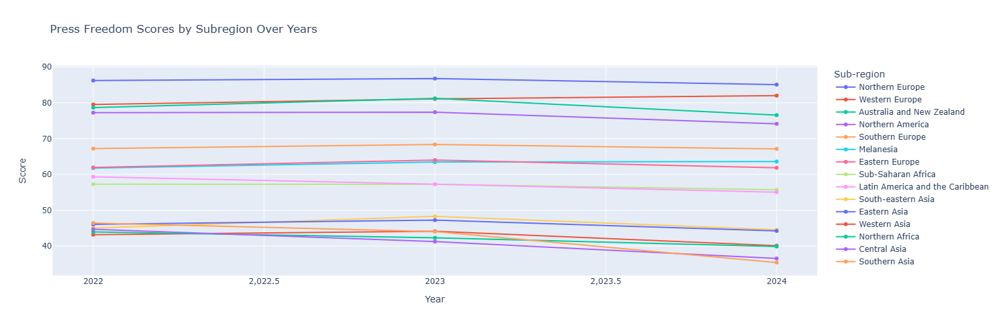

In [61]:
fig_subregion = px.line(press_freedom_subregion, x='Year', y='Score', color='Sub-region Name', markers=True, title='Press Freedom Scores by Subregion Over Years')
fig_subregion.update_layout(xaxis_title='Year', yaxis_title='Score', legend_title='Sub-region', width=1000, height=500)
fig_subregion.show()

***Response to question 2***

Question 1 has already pointed out that press freedom is in decline globally and also that there is high variability in scores. This section will hopefully provide a deeper overview by considering not only how scores have changed across the years within regions and sub-regions but also the general levels of disparity in press freedom within subregions.

***Europe:***

Europe consistently leads in press freedom, with Northern and Western Europe maintaining scores above 80. There are still fluctuations, with a small decline for the former observed in 2024 and an increase for the latter. Southern and Eastern Europe lag behind the rest of Europe with a small decline over the period for both areas.

***Oceania:***

Oceania follows closely behind Europe, with scores around the low 70s. In 2023, Australia and New Zealand ranked slightly above Western Europe, but in 2024 they fell about 6 points behind, indicating a deterioration in press freedom levels. This decline is significant, highlighting growing challenges in these typically high-scoring countries.

***Americas:***

The American region shows a concerning trend, declining from 60.71 in 2022 to 56.51 in 2024. However, the disparity in the region is large. While North America remains among the top 4 globally, just behind Australia and New Zealand, Latin America and the Caribbean lag approximately 20 points behind. The notable decline of 4 points in Latin America, driven by political instability and violence against journalists, is particularly alarming. (UNESCO, 2023; Human Rights Watch, 2023)

***Africa:***

Africa's scores are lower than Europe, America, and Oceania, declining from 55.76 in 2022 to 53.95 in 2024. Northern Africa has some of the lowest scores globally, reflecting political turmoil and restrictive media environments. Sub-Saharan Africa, though much better, still faces significant challenges.

***Asia:***

Asia ranks the lowest among all regions, with scores dropping from 44.70 in 2022 to 40.30 in 2024. The bottom 2 globally, Central, Southern, and Western Asia show severe declines since 2022. These regions contain the worst-ranking countries globally (for example Iran, Afghanistan, North Korea, China and Syria). Eastern Asia ranks slightly better in the region, however, still lags behind alarming scores such as the ones reported in Latin America.

## Question 3: Are there any countries that show a significantly higher or lower score in relationship to their subregional counterparts? Identify them and discuss. Can this be explained by geopolitical events?

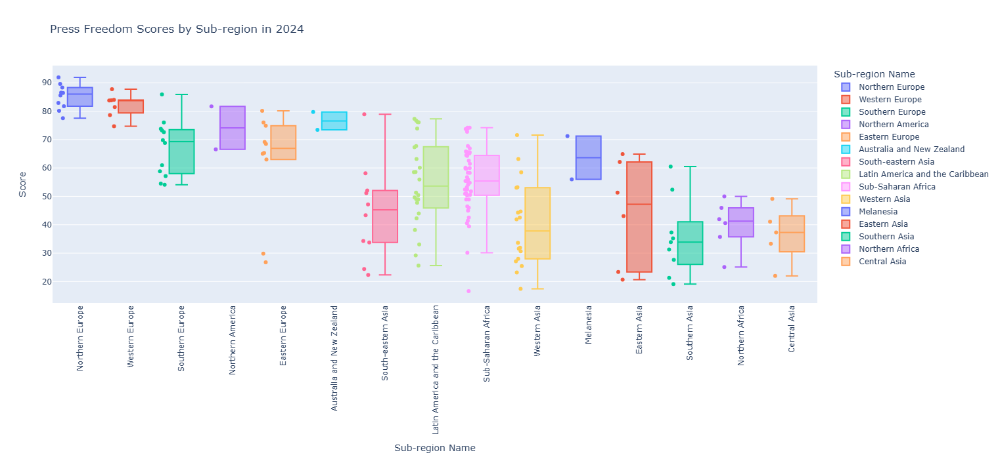

In [62]:
fig = px.box(pf_2024, x='Sub-region Name', y='Score', points='all', title='Press Freedom Scores by Sub-region in 2024', color = 'Sub-region Name', hover_data=['Country'])


fig.update_layout(
    width=1200,  
    height=700,  
    xaxis_title='Sub-region Name',
    yaxis_title='Score',
    title='Press Freedom Scores by Sub-region in 2024',
)

fig.update_xaxes(tickangle=-90)


fig.show()

***Outliers:***

Whether a country is classed as significantly higher or lower with respect to the rest of its subregion, the identification will be based on countries showing as outliers on the boxplot. Below, a breakdown and a summary for each:

**Russian Federation (Score: 29.86):**

Since the invasion of Ukraine in 2022, Russia has experienced a concerning decline in general freedoms. The government through stringent legislation forces audits on independent media outlets and journalists that can result in imprisonment and fines when the outcome is "non-compliant". Reports suggest that many journalists have fled the country due to these conditions and many have also been killed. (Malig 2023; Amnesty 2024).


**Belarus (Score: 26.80):**

Following the 2020 controversial election of president Lukashenko. The Belarus government has been actively silencing dissent through arrests and harassment of journalists, to the extent that journalists have been jailed even years after they left the journalistic profession, with many reported as voluntarily exiled (Plotnikova 2023; Di Benedetto 2024).

**Eritrea (Score:16.64):**

With a score of 16.64, Eritrea is the lowest-ranking country in the world for press freedom. In general, the country restricts many human freedoms and the fact that there has been no election in the last 30 years is surely a contributing factor. With journalism "effectively banned" in the country (RSF, 2023), Eritrea has also hit headlines for jailing independent journalists without formal charges (Monitor, 2024).

**Additional Remarks**

Though not marked as an outlier, East Timor also deserves a few words in light of the progress made since 2002. Timor Leste is the highest Country in terms of press freedom in Southeastern Asia (78.92), by far. 
After its independence from Indonesia in 2002, the general situation of Timor Lester compared to the rest of the area is much improved, being labeled as the "youngest nation" it is reported that “journalists are usually free to report the news and are rarely the targets of harassment or physical attacks” and “no journalist has ever been jailed in connection with their work.” (Strangio, 2024)

**Final Remarks**

Besides identifying outlying countries in terms of press freedom by subregion, as a follow up from the previous question the interactive graph provides an even deeper contextualization for the high degrees of variability among countries, identifying the extent of the disparities in press freedom levels around the world. For example, countries like China, North Korea, Syria, Iran, and Afghanistan are among the lowest-scoring countries in terms of press freedom. However, based on the rest of their sub-regional counterparts, these countries feature at the lower end of the whiskers and not as outlying values, which I believe is very significant as a factor in explaining the large disparity in press freedom across regions and subregions.



## Question 4 Identify the countries with the highest level of change in press freedom over the span of two years.


To produce this data, I will first select all years apart from 2023. I will then use pivot tables to rearrange the data and turn the years into columns that will contain the scores by using pivot tables. From that, I will create a column with the difference between 2024 and 2022 scores and store the top 10 and bottom 10 in two separate variables. I will then use these variables to produce subploits with plotly which will show the changes side by side 

In [63]:
pf_2022_2024 = press_freedom[press_freedom['Year'] != 2023]
rearranged_data = pf_2022_2024.pivot(index='Country', columns='Year', values='Score').reset_index()
rearranged_data.columns = ['Country Name', 'Score_2022', 'Score_2024']
rearranged_data['Score Difference'] = rearranged_data['Score_2024'] - rearranged_data['Score_2022']
top_increases = rearranged_data.nlargest(10, 'Score Difference')
top_decreases = rearranged_data.nsmallest(10, 'Score Difference')


In [64]:
top_increases

,Country Name,Score_2022,Score_2024,Score Difference
98,Mauritania,58.10,74.20,16.10
51,Fiji,56.91,71.23,14.32
49,Eswatini,46.42,58.31,11.89
54,Gabon,56.00,65.83,9.83
109,Netherlands,77.93,87.73,9.80
127,Qatar,49.03,58.48,9.45
159,Ukraine,55.76,65.00,9.24
13,Benin,48.39,56.73,8.34
152,Thailand,50.15,58.12,7.97
30,Colombia,42.43,49.63,7.20


In [65]:
top_decreases

,Country Name,Score_2022,Score_2024,Score Difference
14,Bhutan,76.46,37.29,-39.17
0,Afghanistan,38.27,19.09,-19.18
63,Guyana,76.41,60.10,-16.31
83,Kyrgyzstan,64.25,49.11,-15.14
20,Burkina Faso,73.12,58.24,-14.88
4,Argentina,77.28,63.13,-14.15
123,Peru,61.75,47.76,-13.99
160,United Arab Emirates,44.46,30.62,-13.84
43,Ecuador,64.61,51.30,-13.31
11,Belarus,39.62,26.80,-12.82


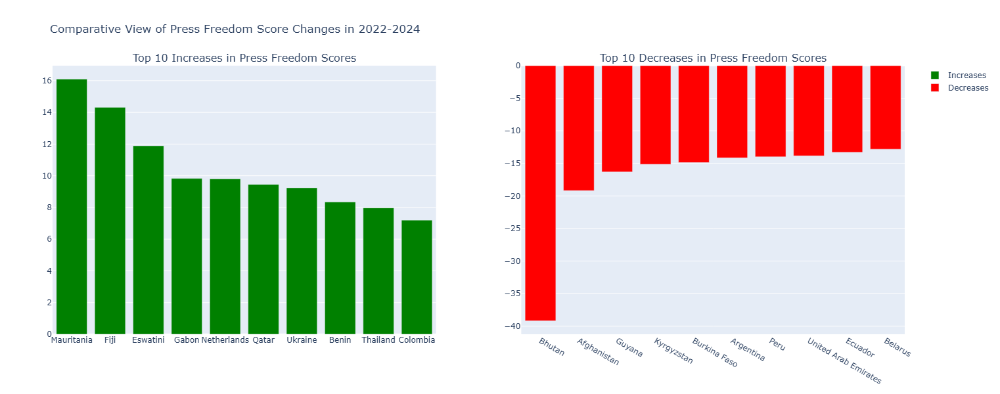

In [66]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots

fig = make_subplots(rows=1, cols=2, subplot_titles=("Top 10 Increases in Press Freedom Scores", "Top 10 Decreases in Press Freedom Scores"))
fig.add_trace(go.Bar(x=top_increases['Country Name'], y=top_increases['Score Difference'], name='Increases', marker_color='green'), row=1, col=1)
fig.add_trace(go.Bar(x=top_decreases['Country Name'], y=top_decreases['Score Difference'], name='Decreases', marker_color='red'), row=1, col=2)
fig.update_layout(title_text="Comparative View of Press Freedom Score Changes in 2022-2024", height=600, width=1000)
fig.show()

The subplots provide, side by side, a visualisation of the top 10 increases and decrease in press freedom levels between 2022 and 2024. The interactive nature of plotly graphs also enables,by hovering over the graphs, to see how many points each country has increased or decreased its score throughout the years.

## Question 5: Identify the relationship between press freedom and government classification (i.e., closed autocracy, electoral autocracy, electoral democracy, liberal democracy)

To answer this question, I will first group the relevant features by year and regime classification, calculating the mean scores for the various contexts to visualize them. To ensure efficiency in executing the visualization, I will create a function to generate bar charts for each context, comparing scores across different regime types over the years. Finally, I will use the function to plot bar charts for each context, showing the mean scores by regime classification. I will finally select the same features for correlation analysis, generate the correlation matrix for these features, and show the coefficients on a seaborn heatmap.

In [67]:
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
press_fredom_score_by_government = press_freedom.groupby(['Year','Regime Score Label'])['Score'].mean().reset_index()
economic_press_fredom_score_by_government = press_freedom.groupby(['Year','Regime Score Label'])['Economic Context'].mean().reset_index()
social_press_fredom_score_by_government = press_freedom.groupby(['Year','Regime Score Label'])['Social Context'].mean().reset_index()
safety_fredom_score_by_government = press_freedom.groupby(['Year','Regime Score Label'])['Safety'].mean().reset_index()
legal_fredom_score_by_government = press_freedom.groupby(['Year','Regime Score Label'])['Legal Context'].mean().reset_index()
political_fredom_score_by_government = press_freedom.groupby(['Year','Regime Score Label'])['Political Context'].mean().reset_index()

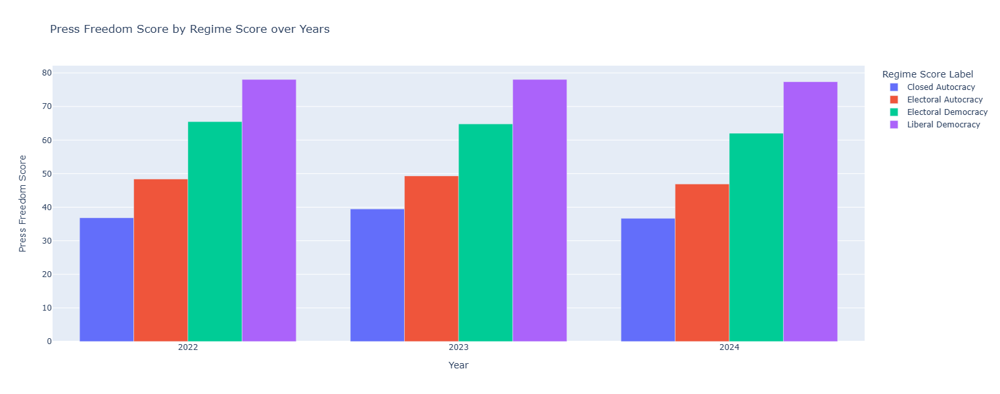

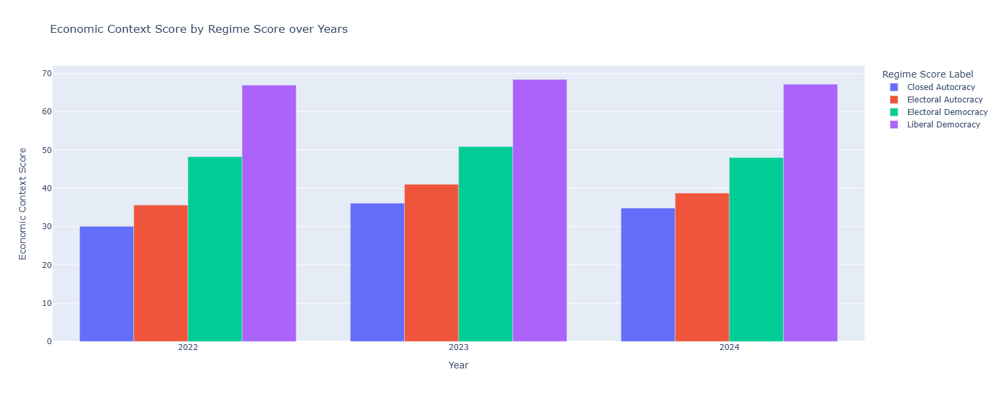

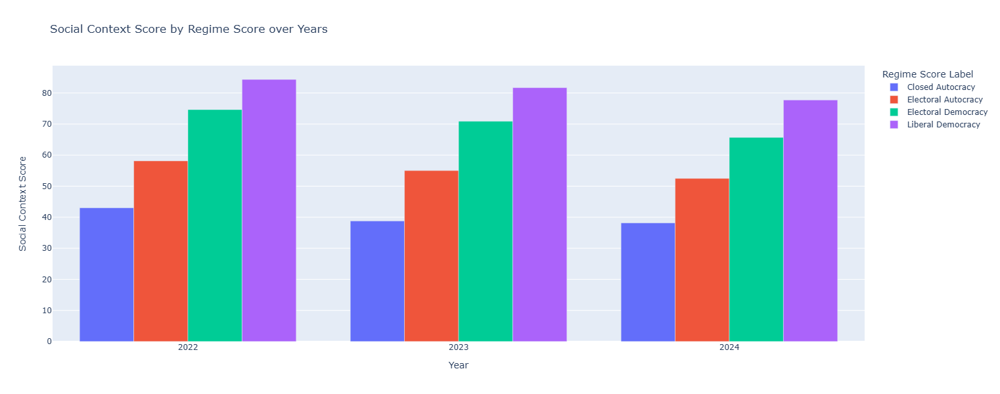

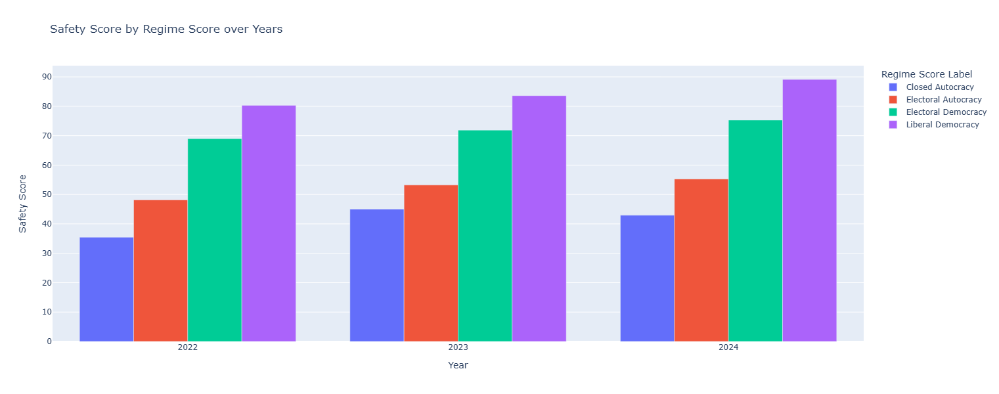

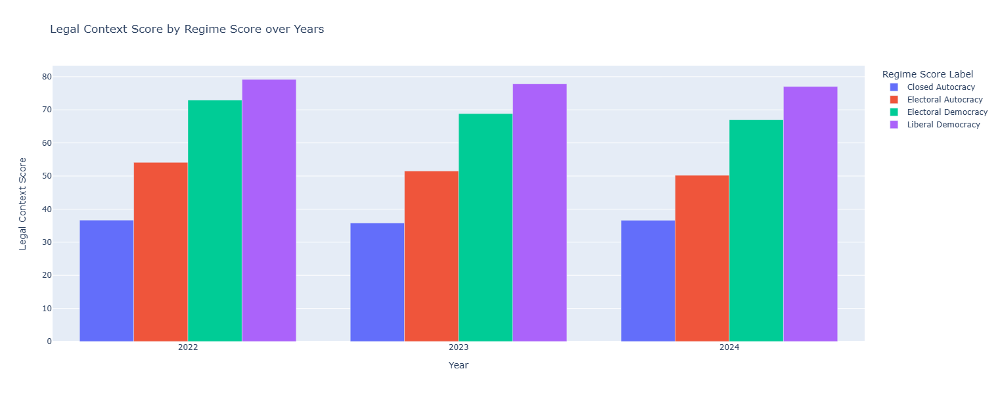

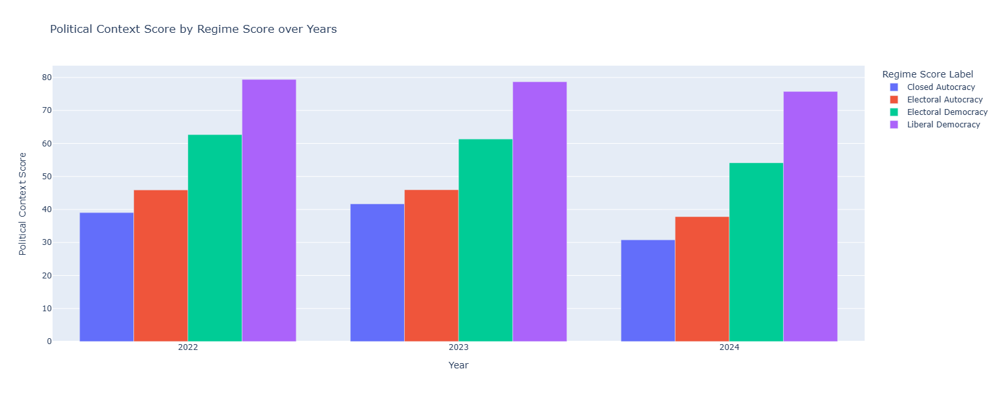

In [68]:
def plot_context_bar(data, context_name, y_label):
    fig = px.bar(data, x='Year', y=context_name, color='Regime Score Label', 
                 barmode='group', title=f'{context_name} by Regime Score over Years', 
                 labels={context_name: y_label, 'Year': 'Year', 'Regime Score Label': 'Regime Score Label'})
    fig.update_layout(width=800, height=600)
    fig.show()


plot_context_bar(press_fredom_score_by_government.rename(columns={'Score': 'Press Freedom Score'}), 'Press Freedom Score', 'Press Freedom Score')
plot_context_bar(economic_press_fredom_score_by_government.rename(columns={'Economic Context': 'Economic Context Score'}), 'Economic Context Score', 'Economic Context Score')
plot_context_bar(social_press_fredom_score_by_government.rename(columns={'Social Context': 'Social Context Score'}), 'Social Context Score', 'Social Context Score')
plot_context_bar(safety_fredom_score_by_government.rename(columns={'Safety': 'Safety Score'}), 'Safety Score', 'Safety Score')
plot_context_bar(legal_fredom_score_by_government.rename(columns={'Legal Context': 'Legal Context Score'}), 'Legal Context Score', 'Legal Context Score')
plot_context_bar(political_fredom_score_by_government.rename(columns={'Political Context': 'Political Context Score'}), 'Political Context Score', 'Political Context Score')

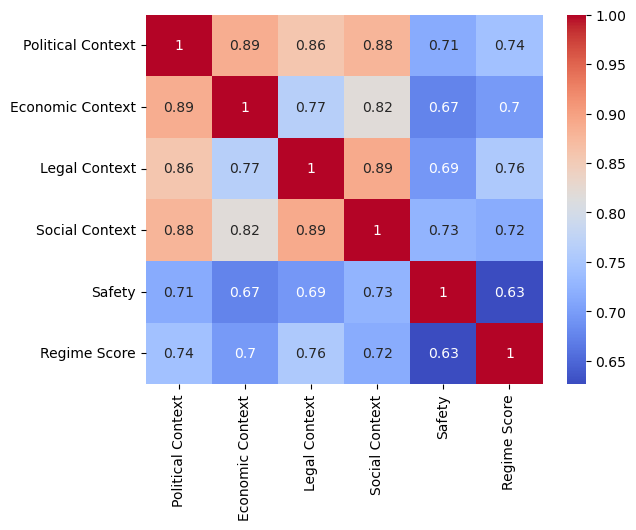

In [69]:
correlation_features = press_freedom[['Political Context', 'Economic Context',
       'Legal Context', 'Social Context', 'Safety','Regime Score']]

correlation = correlation_features.corr()

sns.heatmap(correlation,annot =True,cmap = 'coolwarm')
plt.show()



**Response to Question 5**

The bar charts show that Liberal and Electoral Democracies consistently score higher in sociopolitical, legal and economic contexts for journalists. The correlation matrix provides additional information on the nature of the relationship between each score and the Regime score. I will now discuss the coefficients and their meanings.

**Legal (0.76)  Political Context (0.74) and Economic Context (0.7)**

These moderately high correlations suggest that robust legal and political frameworks in favor of a free press create a secure environment for journalists to operate without fear of reprisal and act as a "watchdog", ensuring that abuses of power are exposed and publicized, fostering informed citizens. (Hamilton, 2021; Gardbaum, 2021). Similarly, a strong economic context for the press ensures an independent framework for the press and media to disseminate more unbiased and truthful information which, like the political and legal context is key to keep citizens informed and governance transparent (Hemel, 2021).

**Social Context (0.72)**
This score measures how well the press can operate free from social constraints, such as gender, class, ethnicity, religion, and cultural pressures. a. A strong correlation with Regime Score suggests that social acceptance of the press is essential for democratic engagement(The Oxford Handbook of Freedom of Speech, Chapter 14), especially when issues around marginalised groups are covered.(Civic, 2023)

**Safety (0.63)**
There is a weaker correlation between Safety and Regime score, however, moderate. This suggests that it is easier for journalists to inform the public in an unbiased way in the absence of reprisals, incarcerations, killings, or any other form of silencing. Therefore, journalist safety is also an important contributor to democracy

This analysis explored the complex relationship between elements of press freedom and whether a country is classed as an autocratic regime or tends towards the more democratic spectrum. It is, I believe, erroneous to think that the lack or presence of press freedom is the byproduct of whether a government might be classed as a dictatorship or as a democracy, as there is a more mutual relationship between press freedom and democracy in a way that press freedom is an important building block to the building of a democratic environment.

## Question 6: Explore different levels of general attitudes towards the media/censorship and type of government classification.

To answer this question, I will visualise the distribution of media and censorship indicators (e.g., CSO Repression, Government Censorship, Media Bias) across different regime types into boxplots to understand whether there are noticeable differences within each government classification. A for loop will be used for efficiency. In the subsequent step, with the help of another for loop I will generate crosstabulations to count occurerence of those categorical features, produce the percentages to use in bar chart visualisation for ease of reference and display the percentage of countries falling into each category. I will then discuss the results.

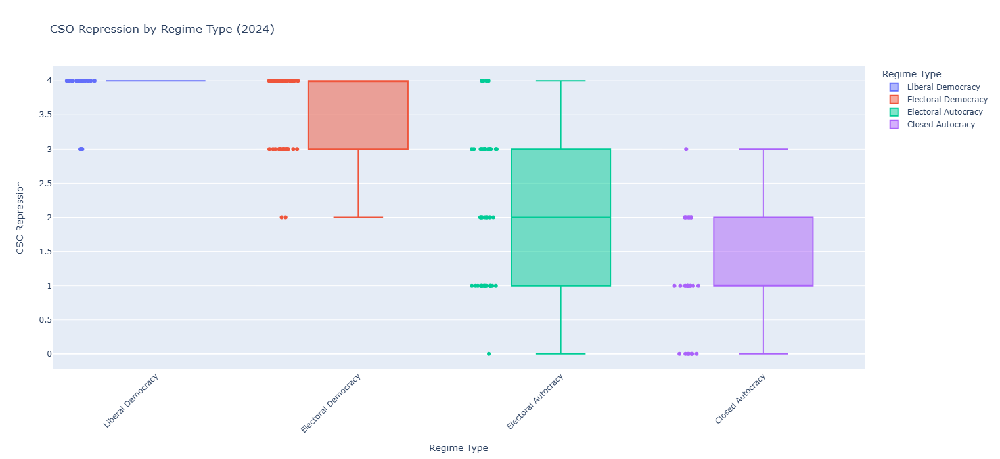

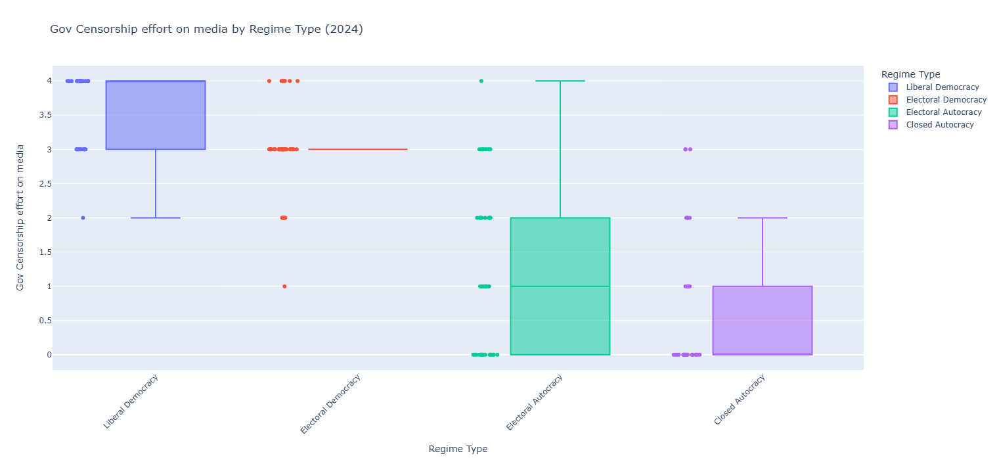

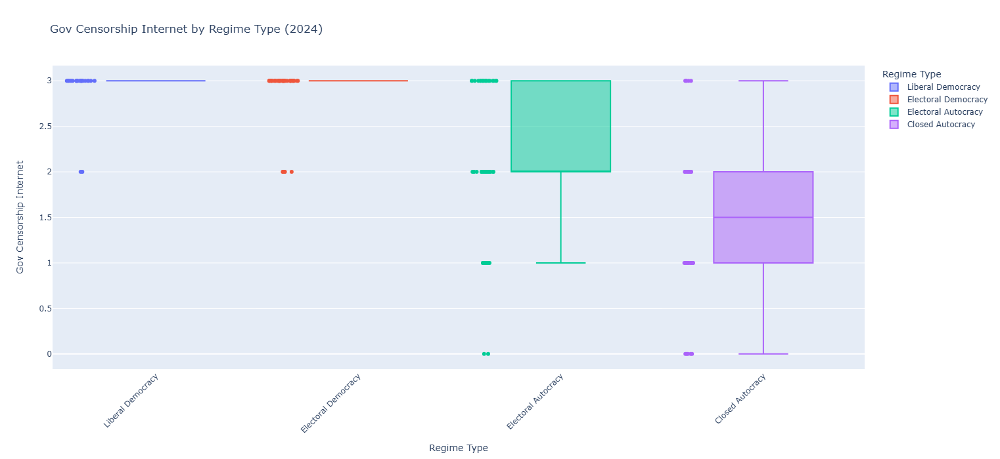

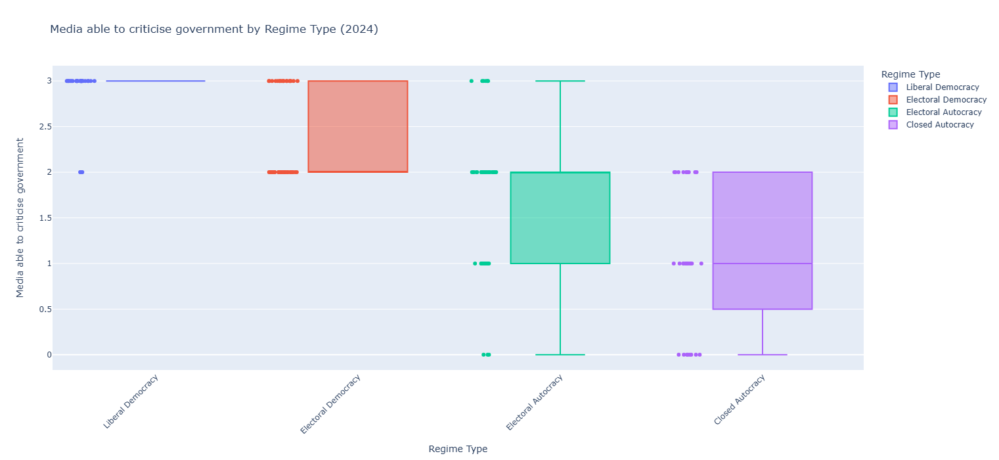

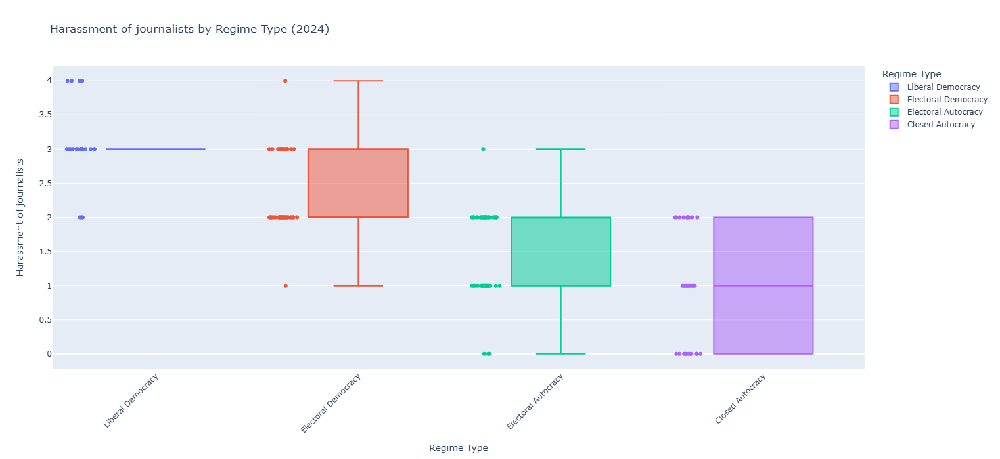

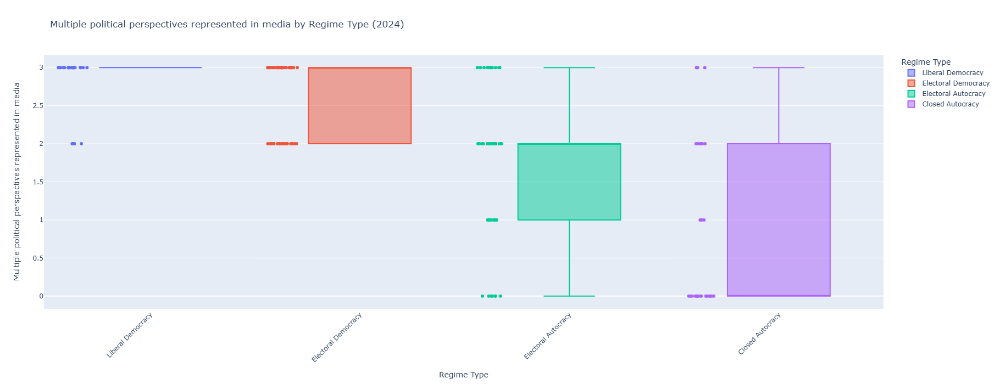

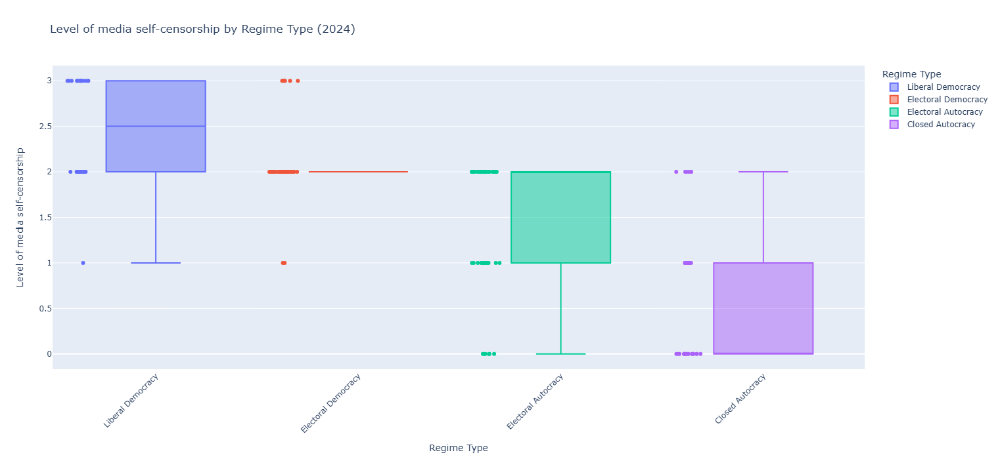

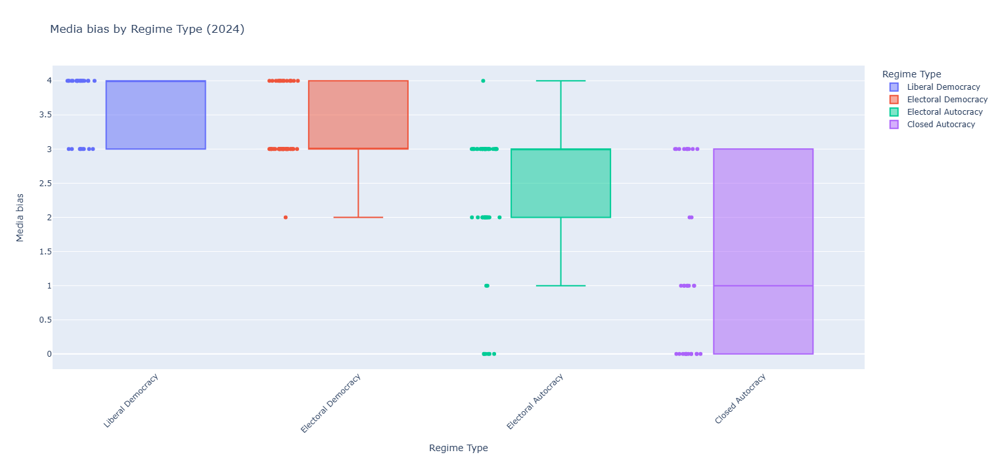

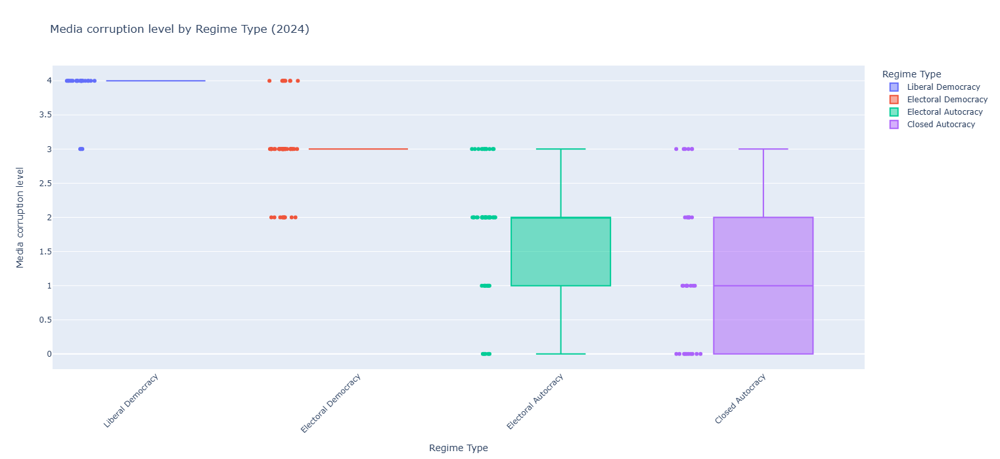

In [70]:
columns = ['CSO Repression','Gov Censorship effort on media','Gov Censorship Internet',
           'Media able to criticise government','Harassment of journalists',
           'Multiple political perspectives represented in media','Level of media self-censorship','Media bias','Media corruption level']

for column in columns:
    fig = px.box(pf_2024, x='Regime Score Label', y=column, color='Regime Score Label',points='all', hover_data = ['Country'],
                 title=f'{column} by Regime Type (2024)', 
                 labels={'Regime Score Label': 'Regime Type', column: column})
    fig.update_layout(xaxis_title='Regime Type', yaxis_title=column, xaxis_tickangle=-45,width=1200,  
    height=700)
    
    fig.show()
   

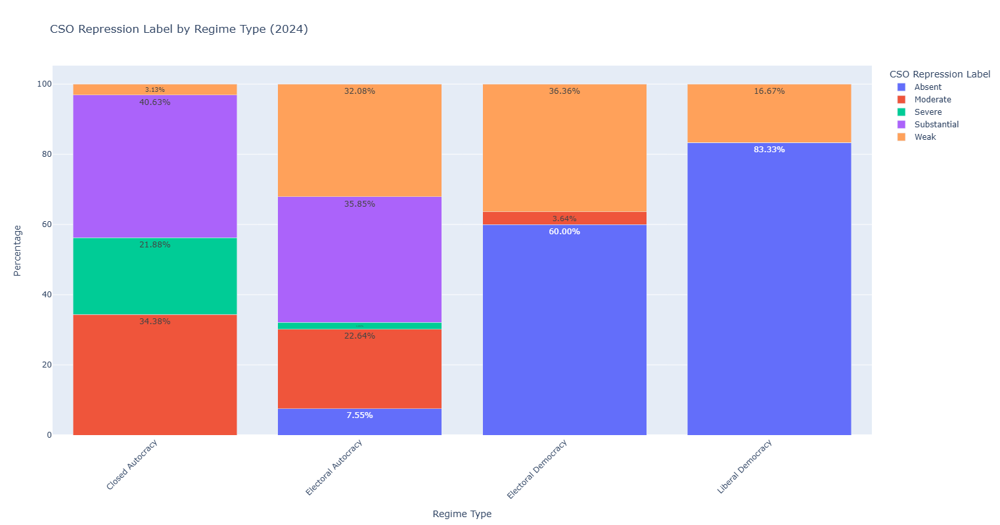

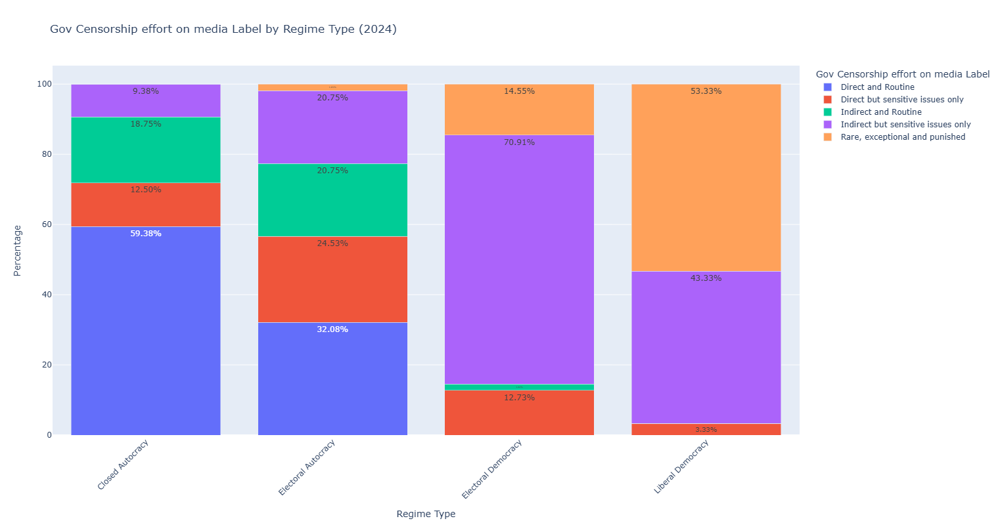

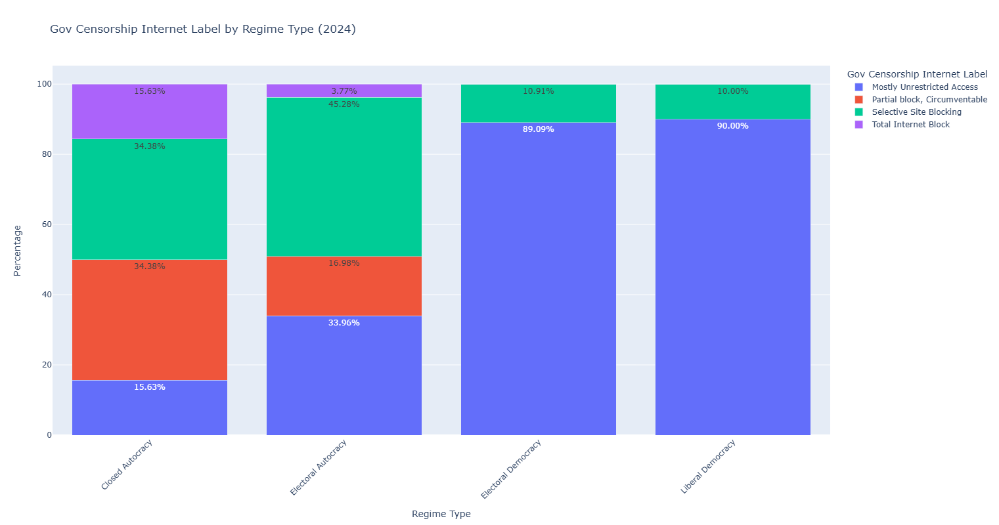

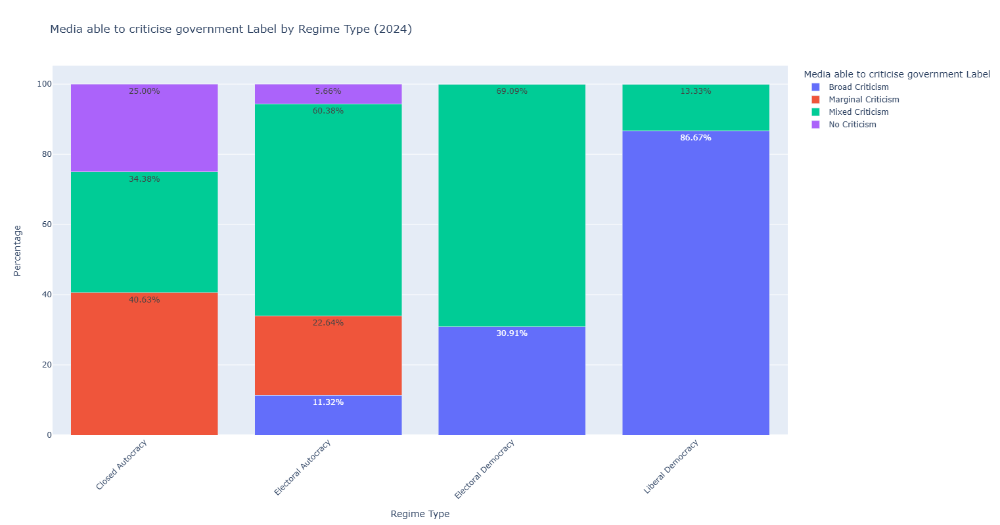

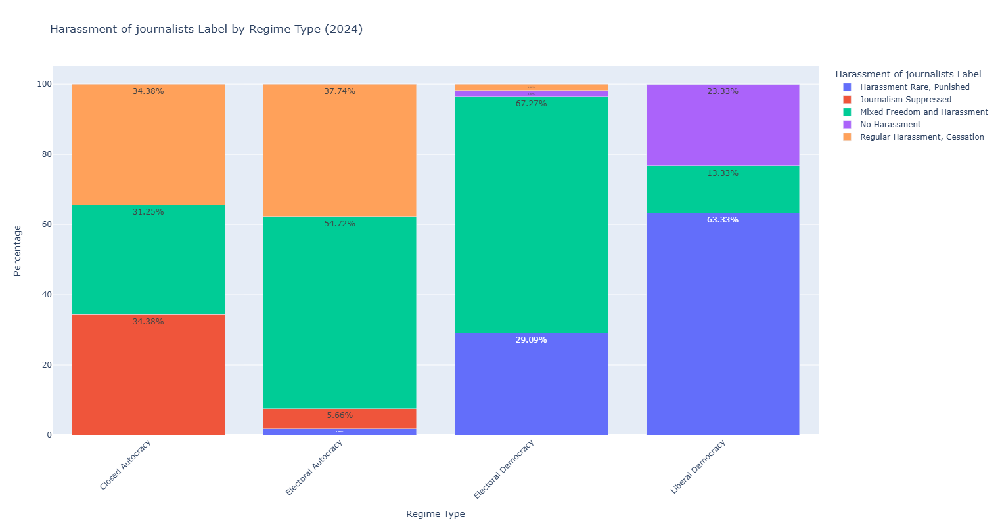

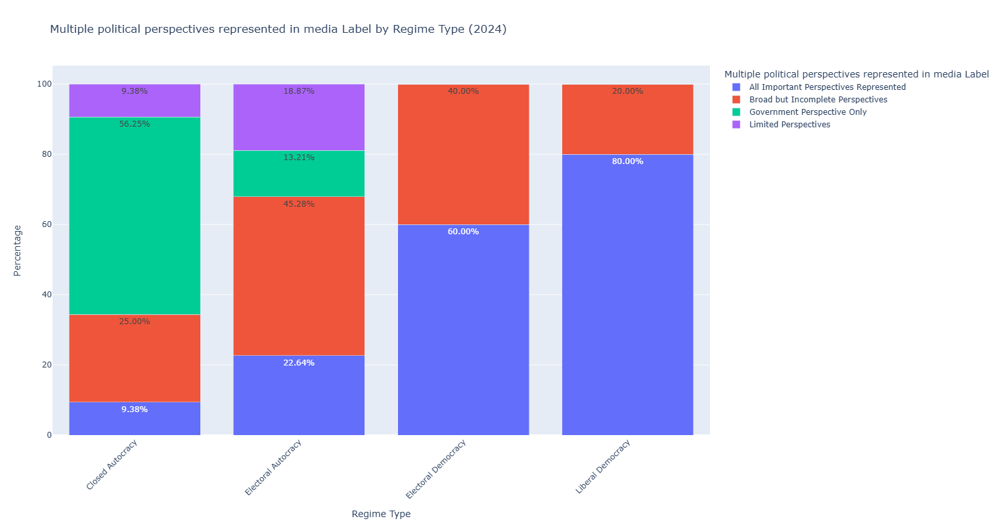

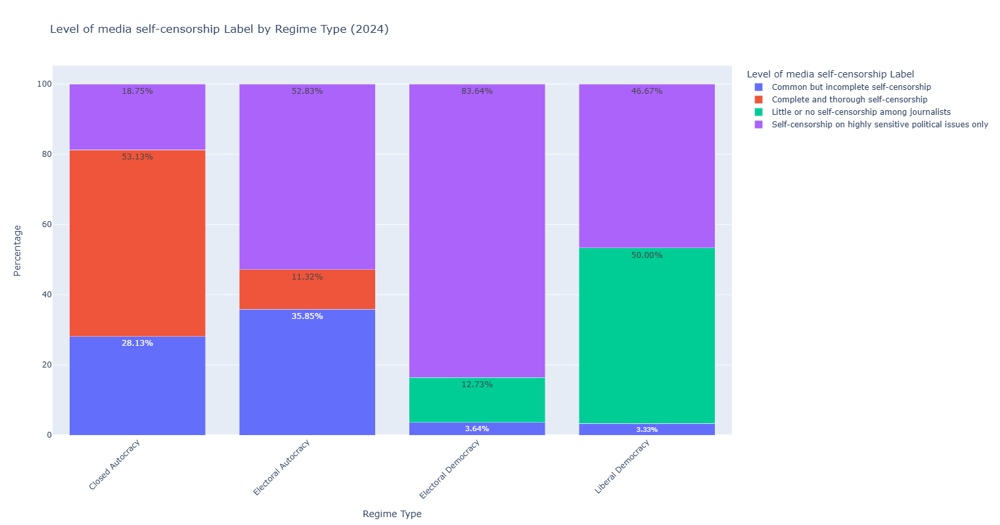

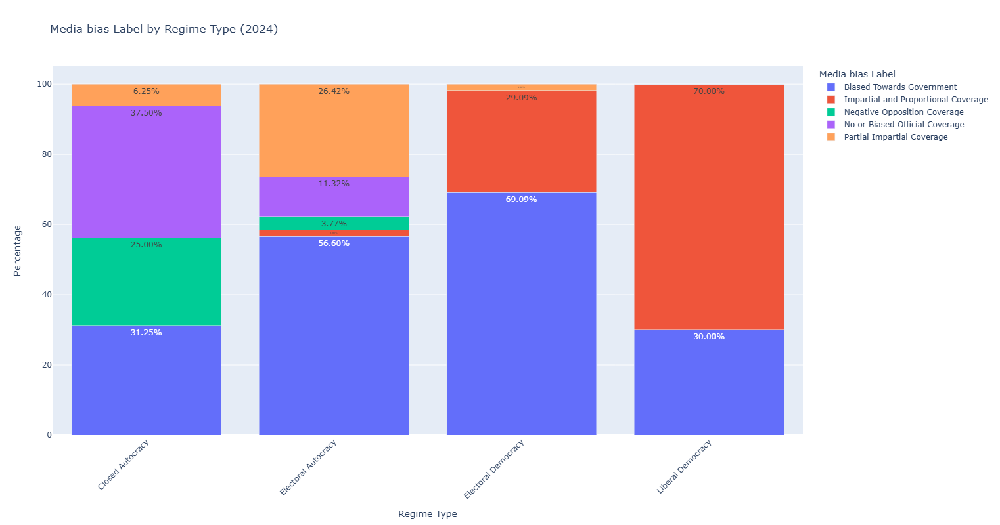

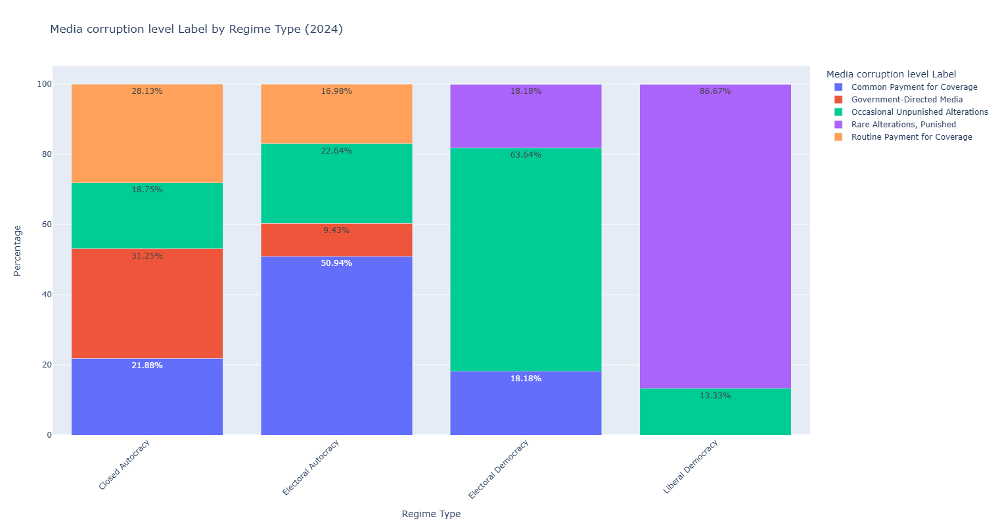

In [71]:
import pandas as pd
import plotly.express as px

cat_columns = ['CSO Repression Label', 'Gov Censorship effort on media Label', 'Gov Censorship Internet Label', 
               'Media able to criticise government Label', 'Harassment of journalists Label', 
               'Multiple political perspectives represented in media Label', 'Level of media self-censorship Label', 
               'Media bias Label', 'Media corruption level Label']

for column in cat_columns:
    crosstab = pd.crosstab(pf_2024['Regime Score Label'], pf_2024[column])
    crosstab_percentage = crosstab.div(crosstab.sum(axis=1), axis=0) * 100
    crosstab_percentage = crosstab_percentage.reset_index().melt(id_vars='Regime Score Label', var_name=column, value_name='Percentage')
    fig = px.bar(crosstab_percentage, 
                 x='Regime Score Label', 
                 y='Percentage', 
                 color=column,
                 labels={'Percentage': 'Percentage', 'Regime Score Label': 'Regime Type'},
                 title=f'{column} by Regime Type (2024)',
                 barmode='stack')
    
    fig.update_layout(
        xaxis_title='Regime Type',
        yaxis_title='Percentage',
        xaxis_tickangle=-45,
        width=1200,
        height=800
    )
    fig.update_traces(texttemplate='%{y:.2f}%', textposition='inside')
    
    fig.show()


The graphs produced show some interesting trends on how press freedom and related indicators differ across different forms of government. From the information gained by the charts it is possible to create a "press freedom profile" which helps in differentiating a government's designation from the levels of press freedom. Below, a breakdown of the analysis in response to question 5.

**Liberal democracies**

Provide supportive environments for press freedom across all indicators. In 83% of these countries, CSO repression is "Absent", with the remaining 17% falling under the "Weak" category. Government censorship of media is direct only in 3% of the countries whilst for 90% of the countries, internet access is mostly unrestricted. In 86% of these countries, journalists are able to criticise the governmennt with a broad range of criticism and harassment of journalists is rare, with 87% of liberal democracies showing either no harassment at (23.3%) all or harassment that is rare and punished (63.33%). Multiple political perspectives are well represented, with 80% of countries having all political perspectives represented. In 96% of the countries media Self-censorship is either non-existent or only for highly sensitive political issues. Media bias and corruption are also generally low with the majority of countries showing  rare instances of corruption that are punished (87%) and coverage that is impartial and proportional (70%).

**Electoral democracies**

Electoral democracies show more various scenarios. CSO repression is "weak" in 36% of the countries,  but "non-existent" only in 60% of the countries. Government censorship efforts are also more prevalent compared to liberal democracies with only 14% of countries reporting "rare involvement" from the government, although in most cases, the inference is only indirect and limited to sensitive issues only. Freedom to criticize the government is "mixed" in 70% of the cases, meaning that some outlets routinely criticize the government but other big ones never do. Harassment incidents are more frequent, as in 67% of countries, "journalists who offend powerful actors are forced to stop but others manage to continue practicing journalism freely for long periods" (VDDEM). Different political perspectives are expressed, but in 40% of countries important ones are often ignored. Self-censorship prevalent in 84% of countries, though only limited to highly sensitive political issues., seen in 60% of countries where journalists exercise caution. in terms of bias and corruption, 69% of these countries have their media biased toward current government and occasional unpunished episodes of corruption occur in 64% of them.

**Electoral autocracies**

In these countries attitudes towards CSO  are various, with 36% and 23% showing respectively substantial and moderate levels of repression. Government censorship is widespread, with 57% of countries showing government involvement in either a direct or indirect fashion. Similarly, only 34% of those countries have unrestricted internet access. The ability to criticize the government is more limited, with 60% of countries having some important media outlets not criticising the government. Routine harassment of journalists is common, being "routine" in 38% of countries, meaning that they face professional or personal consequences from criticising the goverment. The range of political perspectives discussed in the press is also limited, with only  23% of these countries having all perspectives represented. Self-censorship is also considerable, with no country in this category falling into "little to no self-censorship". Media bias is skewed towards government and none of these countries falls under the "Routine and punished alterations" class as far as media corruption is concerned.

**Closed autocracies**

These countries present the most worrying scenario, with CSO repression only falling under the "moderate"(34%), "substantial"(41%) or "severe"(22%) class.  Government censorship is tight, with 59% of cases showing a "direct and routine" involvement from the government and in 69% of cases there is some degree of internet restriction.  Media's ability to criticize the government also shows alarming levels with 40% of countries having only few marginal outlets criticising the government, with another 25% of counties showing no possibility to criticise the government. In 34% of cases, harassment is regular and leads to major consequences such as threats, arrests, and violence against journalists whereas in the other 34% of cases "no journalists dare to engage in journalistic activities that would offend powerful actors
because harassment or worse would be certain to occur" (VDEM). Multiple political perspectives are largely absent, with 56% of countries only representing the government's view. Media bias and corruption are also prevalent, as none of the closed autocracies falls into "Impartial and proportionate coverage" or "Rare alterations, punished" for the respective indicators.

## Question 7: Is there any specific link between government classification/various press freedom indicators and GDP per capita/FDI inflows?

To answer this question I will first isolate all the relevant columns to plot against financial indicators, then, with the aid of a for loop for efficiency I will create scatterplots of all the indicators against GDP per capita. I will then corroborate any relationship by correlating the indicators before proceeding to answer the question.

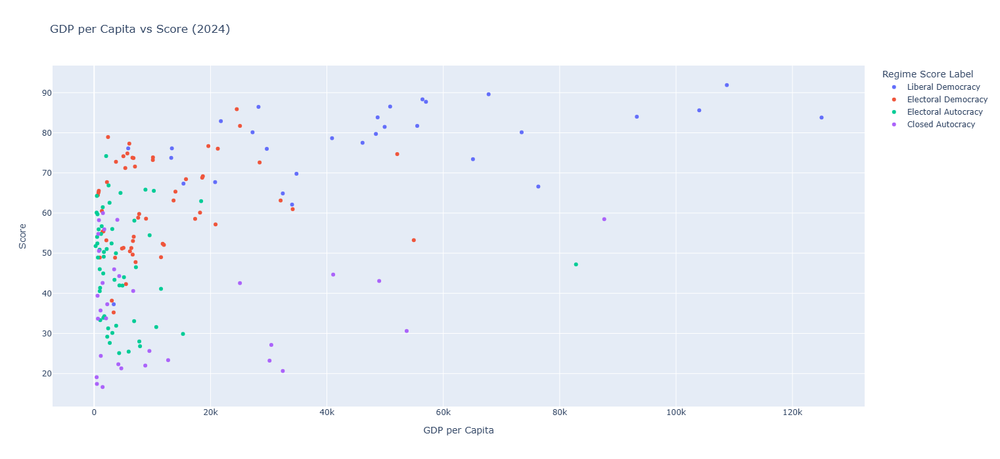

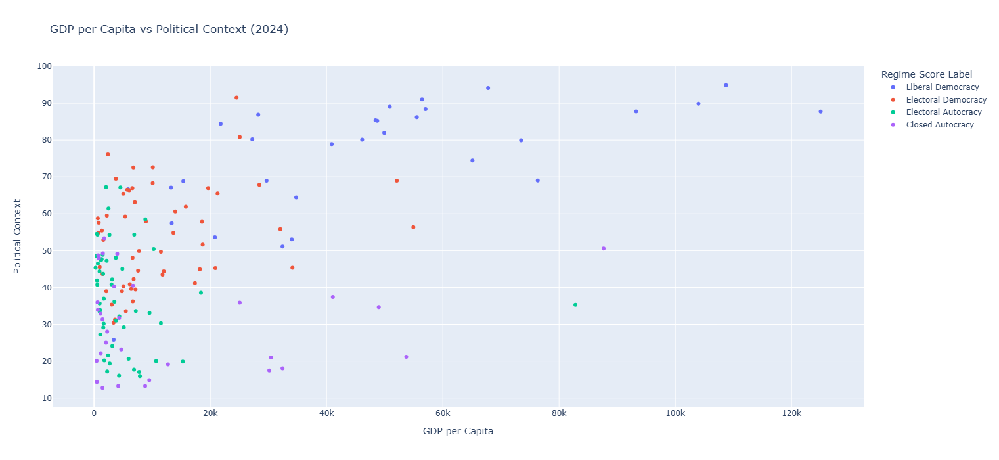

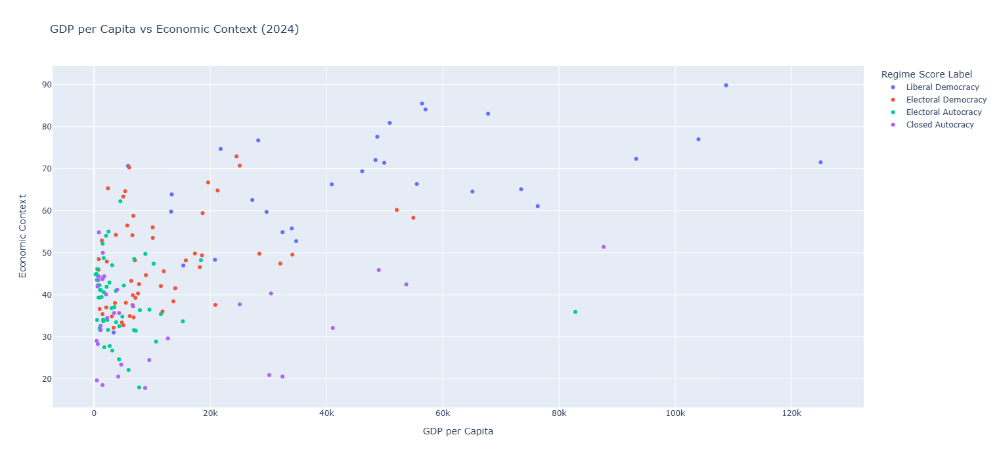

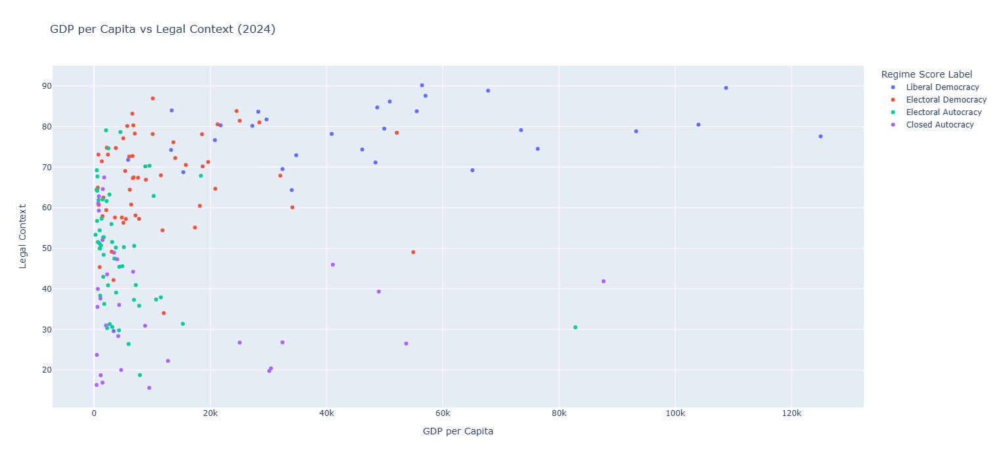

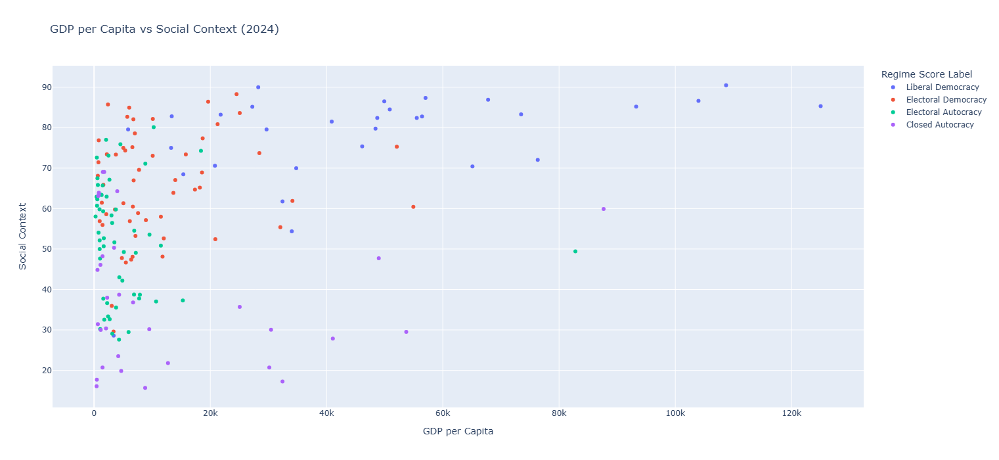

...

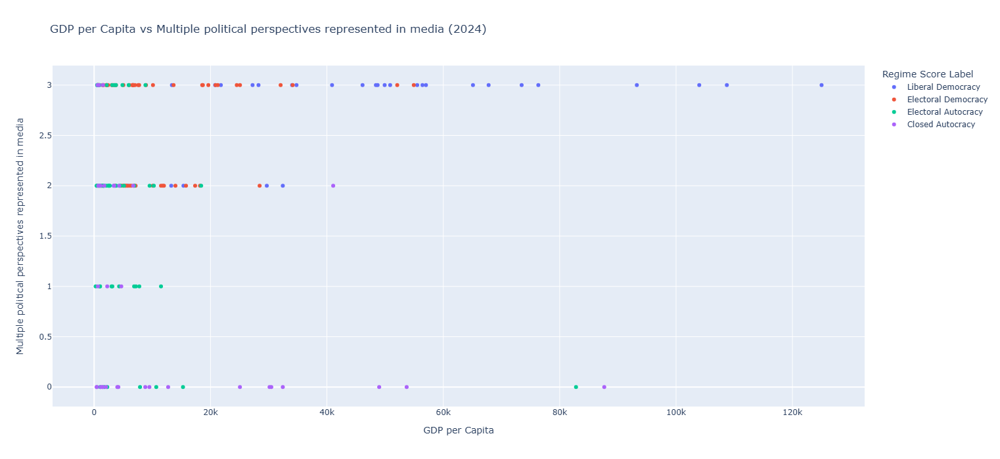

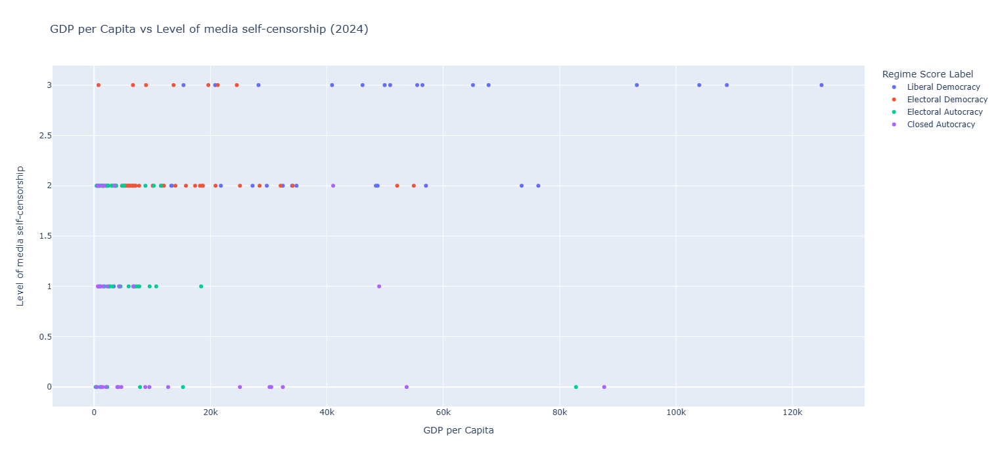

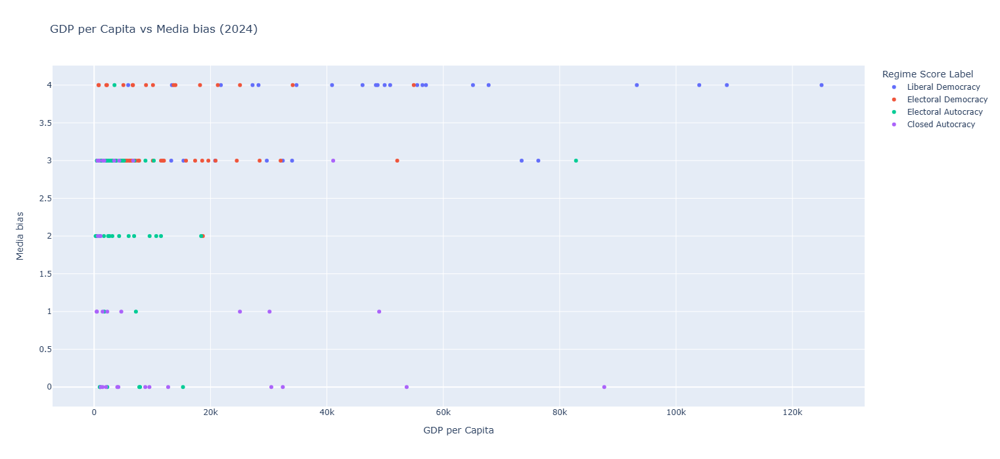

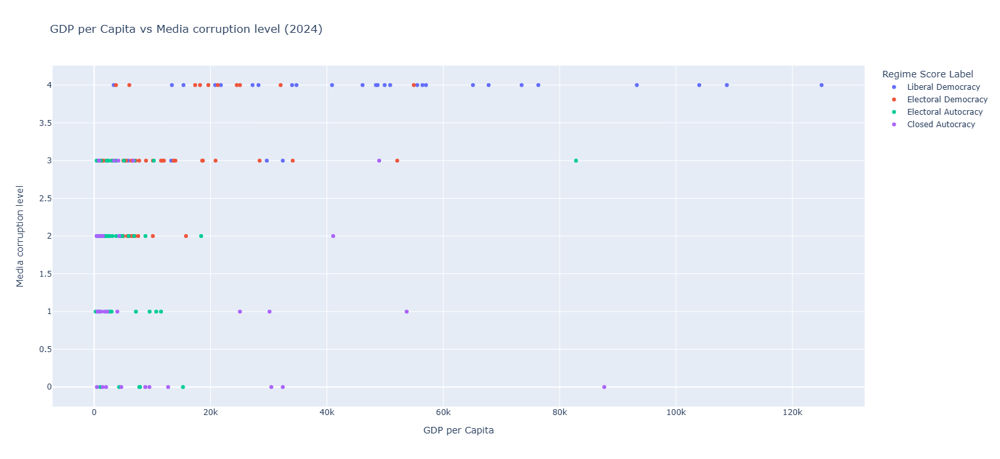

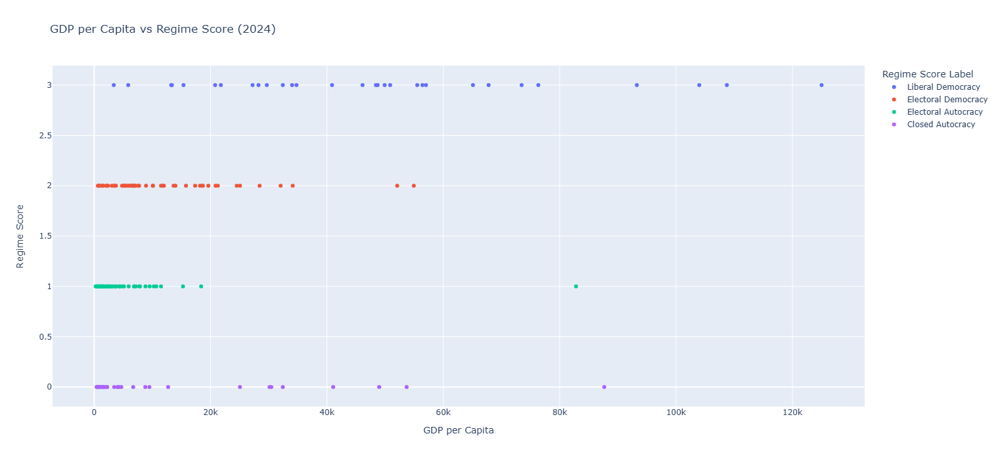

In [72]:
finance_columns = ['Score', 'Political Context', 'Economic Context',
                   'Legal Context', 'Social Context', 'Safety', 'CSO Repression',
                   'Gov Censorship effort on media', 'Gov Censorship Internet',
                   'Media able to criticise government', 'Harassment of journalists',
                   'Multiple political perspectives represented in media',
                   'Level of media self-censorship', 'Media bias',
                   'Media corruption level', 'Regime Score', 'GDP per capita']
for column in finance_columns:
    if column != 'GDP per capita':  
        fig = px.scatter(pf_2024, x='GDP per capita', y=column, color='Regime Score Label', 
                         hover_data=['Country'],
                         title=f'GDP per Capita vs {column} (2024)', 
                         labels={'GDP per capita': 'GDP per Capita', column: column})
        fig.update_layout(xaxis_title='GDP per Capita', yaxis_title=column, width=1200, height=700)
        fig.show()


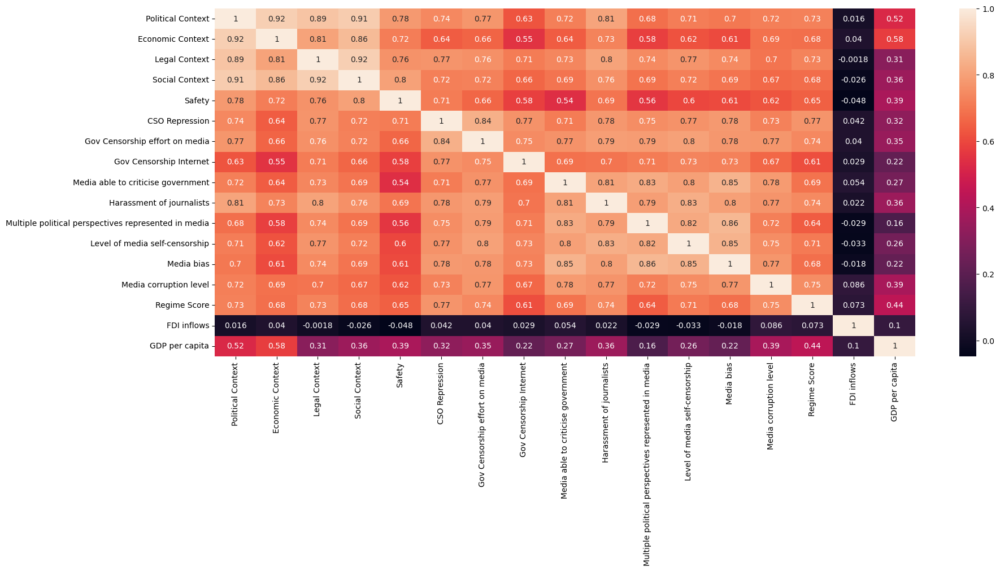

In [73]:
finance_columns = pf_2024[['Political Context', 'Economic Context', 'Legal Context', 'Social Context', 'Safety', 'CSO Repression','Gov Censorship effort on media', 'Gov Censorship Internet','Media able to criticise government', 'Harassment of journalists','Multiple political perspectives represented in media','Level of media self-censorship', 'Media bias','Media corruption level', 'Regime Score', 'FDI inflows', 'GDP per capita']]
corr = finance_columns.corr()
plt.figure(figsize = (20,8))
sns.heatmap(corr, annot = True)
plt.show()

First of all, the analysis shows that, unlike GDP per capita, levels of FDI inflows have little to no relevance to levels of press freedom. Furthermore, the scatterplots indicate that GDP per capita tends to be higher in countries where all the other continuous indicators of press freedom (the "Scores") are high. Along similar lines, analysis of GDP per capita levels against the other ordinal features (discussed in the previous questions) shows that GDP per capita is also higher in countries that have fewer restrictions imposed against the press and journalists in general. The differences shown in the final scatterplot are more clear-cut compared to others, and with due caution about electoral democracies, liberal democracies have consistently higher levels of GDP per capita than the rest of the other denominations. 

The correlation matrix provides a clearer overview of the coefficients correlating with GDP per capita:

- **Economic (0.56), Political (0.5), Regime(0.44) Scores - Moderate**: Higher levels in these scores are associated with higher levels of GDP per capita


- **Social Context (0.36), CSO Repression (0.32), Safety (0.39), Media Corruption (0.39) Gov Media Censorship (0.35), Gov Internet Censorship (0.22) - Weak**: These correlations are weaker, however, still meaningful to this analysis as they still show a relationship between the nuances in treatment of press and journalist from government and society and the levels of GDP per capita. These coefficients tell us that countries with better environments in these features perform better in terms of GDP per capita.

To conclude, the analysis of GDP per capita against different indicators of press freedom reveals that, although at varying degrees of strength in coefficients, countries that are more liberal towards the press and are democratic tend to have higher GDP per capita. Though not conclusive, as the strength in some of the relationships is weak, with 0.44 as coefficient between Regime and GDP per capita it can be hinted that there is a positive relationship between democracy and one important economic indicator such as GDP per capita

## Question 8: Use the World Data to create a heatmap showing levels of press freedom across the world

Using the Plotly library, I will use the choropleth graph to produce a heatmap showing changes in levels of press freedom over time. Apart from the general guidance that I followed from the Plotly documentation, which explains how to build graphs of this type, I have tweaked the graph to ensure that the colors of the heatmap are in line with the guidance provided by the RSF website that I addressed at the feature engineering stage. This was done by using a custom color stage that was then passed to the graph. This map is useful for two reasons: first, it shows changes globally and interactively and second, it would have a good use for ONGs campaigning for journalist rights around the world in mapping the countries where their activity is needed the most.

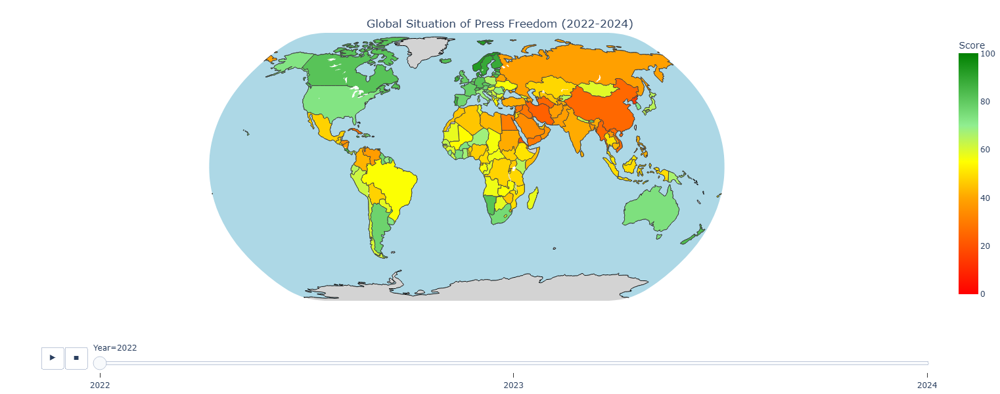

In [74]:
import plotly.express as px


pf_sorted = press_freedom.sort_values(by='Year',ascending = True)

custom_color_scale = [
    (0.0, "red"),         
    (0.4, "orange"),       
    (0.55, "yellow"),      
    (0.7, "lightgreen"),   
    (1.0, "green")        
]


fig = px.choropleth(pf_sorted,locations="ISO",  color="Score",  
    hover_name="Country Name",  
    hover_data={"Score": True, "Regime Score Label": True, "Year": True, "Situation":True},  
    animation_frame="Year",  
    projection="natural earth",
    title="Global Situation of Press Freedom (2022-2024)",
    color_continuous_scale=custom_color_scale,
    range_color=(0, 100),  
    template="plotly_white" ) 

fig.update_layout(
    geo=dict(
        showframe=False,
        showcoastlines=True,  
        coastlinecolor="Black",  
        landcolor="LightGray",  
        showland=True,
        showocean=True,
        oceancolor="LightBlue",  
        projection_scale=1  
    ),
    width=1000,
    height=600,
    margin=dict(l=0, r=0, t=50, b=0),  
    title={
        'text': "Global Situation of Press Freedom (2022-2024)",
        'y':0.95,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top'}
)


fig.show()

## Task 3: Classification

The classification exercise will create a model that, based on selected features, will predict government classification from relevant indicators related to press freedom, both continuous and ordinal. As the global "Score" feature is an average of all the other scores, it will be excluded. To simplify the model, I will also create a function condensing electoral and liberal democracy as "Democracy" and closed and electoral autocracies as "autocracy". Furthermore, in order to avoid data spillage so that data for the same country does not appear in both datasets but for different years, I will ensure the split is done in a way that the same country only appears in one dataset and not in the other one. I will then discuss the results by referring to the relevant validation scores

In [75]:
def classify_regime(label):
    if label in ['Closed Autocracy', 'Electoral Autocracy']:
        return 'Autocracy'
    elif label in ['Electoral Democracy', 'Liberal Democracy']:
        return 'Democracy'
    else:
        return np.nan  

press_freedom['Binary Level'] = 0 

for index, row in press_freedom.iterrows():
    press_freedom.at[index, 'Binary Level'] = classify_regime(row['Regime Score Label'])

C:\Users\alfio\AppData\Local\Temp\ipykernel_24100\1490286142.py:12: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value 'Democracy' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.



Encoding the "condensed" variable and ensuring the classes are balanced

In [76]:
from sklearn.preprocessing import LabelEncoder

le = LabelEncoder()
press_freedom['Binary Classification'] = le.fit_transform(press_freedom['Binary Level'])

press_freedom.head()

,ISO,Score,Political Context,Economic Context,Legal Context,Social Context,Safety,Situation,Region Name,Sub-region Name,...,Multiple political perspectives represented in media Label,Media bias Label,Media corruption level Label,Regime Score Label,Level of media self-censorship Label,Country Name,FDI inflows,GDP per capita,Binary Level,Binary Classification
0,NOR,91.89,94.87,89.84,89.50,90.48,94.74,Good,Europe,Northern Europe,...,All Important Perspectives Represented,Impartial and Proportional Coverage,"Rare Alterations, Punished",Liberal Democracy,Little or no self-censorship among journalists,Norway,1.290380e+10,108729.18690,Democracy,1
1,DNK,89.60,94.11,83.07,88.82,86.90,95.09,Good,Europe,Northern Europe,...,All Important Perspectives Represented,Impartial and Proportional Coverage,"Rare Alterations, Punished",Liberal Democracy,Little or no self-censorship among journalists,Denmark,3.421274e+10,67790.05399,Democracy,1
2,SWE,88.32,91.03,85.50,90.16,82.78,92.12,Good,Europe,Northern Europe,...,All Important Perspectives Represented,Impartial and Proportional Coverage,"Rare Alterations, Punished",Liberal Democracy,Little or no self-censorship among journalists,Sweden,4.588178e+10,56424.28470,Democracy,1
3,NLD,87.73,88.41,84.09,87.59,87.34,91.23,Good,Europe,Western Europe,...,All Important Perspectives Represented,Impartial and Proportional Coverage,"Rare Alterations, Punished",Liberal Democracy,Self-censorship on highly sensitive political ...,Netherlands,-1.207602e+10,57025.01246,Democracy,1
4,FIN,86.55,89.05,80.90,86.16,84.52,92.13,Good,Europe,Northern Europe,...,All Important Perspectives Represented,Impartial and Proportional Coverage,"Rare Alterations, Punished",Liberal Democracy,Little or no self-censorship among journalists,Finland,1.336366e+10,50871.93045,Democracy,1


In [77]:
press_freedom.groupby(['Binary Level','Year'])['Country'].count()

Binary Level  Year
Autocracy     2022    83
              2023    84
              2024    85
Democracy     2022    87
              2023    86
              2024    85
Name: Country, dtype: int64

Performing the split on the filtered entities. I do select unique country names and then split them into train entities and test entities to avoid the same country in both datasets, I then store the split into train and test data and pass the relevant columns to the individual train and test variables. I then standardize the continuous features to address the different magnitudes within the data. I then fit the model on the train dataset, run the prediction on the test and show the results. I have chosen Random Forest Classifier because it is effective on categorical and continuous variables and is also resistant to overfitting and robust to outliers

In [78]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, classification_report
from sklearn.preprocessing import StandardScaler



entities = press_freedom['Country'].unique()
train_entities, test_entities = train_test_split(entities, test_size=0.2, random_state=42)


train_data = press_freedom[press_freedom['Country'].isin(train_entities)]
test_data = press_freedom[press_freedom['Country'].isin(test_entities)]


feature_columns = [
    'Political Context', 'Economic Context', 'Legal Context', 'Social Context', 'Safety',
    'CSO Repression', 'Gov Censorship effort on media', 'Gov Censorship Internet',
 'Harassment of journalists',
    'Level of media self-censorship', 'Media bias', 'Media corruption level',
    'FDI inflows', 'GDP per capita'
]

X_train = train_data[feature_columns]
y_train = train_data['Binary Level']
X_test = test_data[feature_columns]
y_test = test_data['Binary Level']


scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)


rf = RandomForestClassifier(n_estimators=500, random_state=42)
rf.fit(X_train_scaled, y_train)


y_pred = rf.predict(X_test_scaled)
print("Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))


Accuracy: 0.8823529411764706
Classification Report:
               precision    recall  f1-score   support

   Autocracy       0.80      0.93      0.86        40
   Democracy       0.95      0.85      0.90        62

    accuracy                           0.88       102
   macro avg       0.88      0.89      0.88       102
weighted avg       0.89      0.88      0.88       102



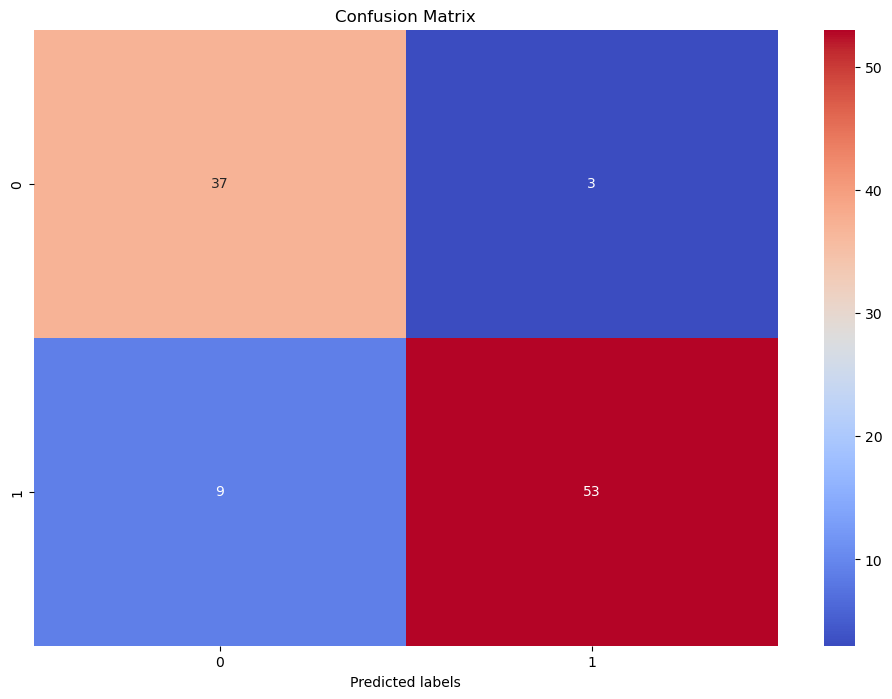

In [79]:
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(y_test, y_pred)

plt.figure(figsize=(12, 8))
sns.heatmap(cm, annot=True, fmt='g', cmap='coolwarm')
plt.xlabel('Predicted labels')
plt.title('Confusion Matrix')
plt.show()

<Figure size 1200x800 with 0 Axes>

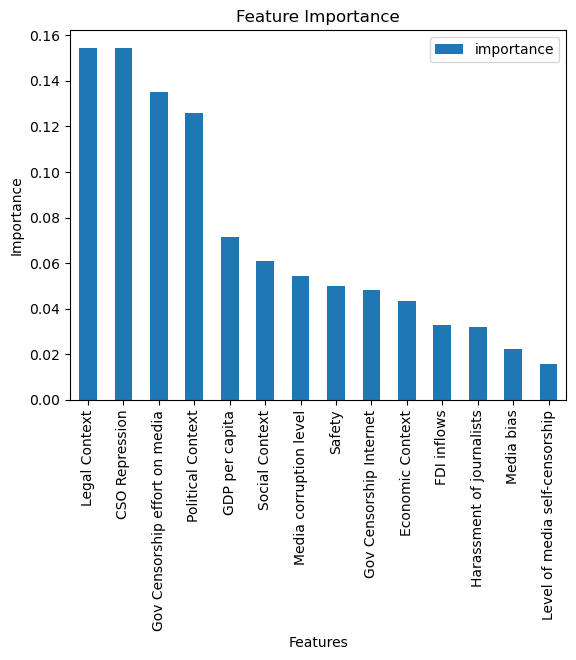

In [80]:
feature_importances = pd.DataFrame(rf.feature_importances_,index = X_train.columns,columns=['importance']).sort_values('importance', ascending=False)

plt.figure(figsize=(12, 8))
feature_importances.plot(kind='bar')
plt.title('Feature Importance')
plt.xlabel('Features')
plt.ylabel('Importance')
plt.show()

The model's overall accuracy is 88%, with the highest accuracy (95%) for democracy and 80% for autocracies. High recall is also produced for autocracies, in fact, out of 40, 37 were predicted correctly. The lower accuracy against recall indicates that the model can improve regarding true positives for this class, as 9 democracies were incorrectly classified as autocracies. For democracy, we have the opposite scenario, and so the lower recall - but out of all the instances predicted as democracy, 53 out of 56 instances were correct. It is possible that a slight class imbalance impacted the model, however, results are generally satisfactory. The feature importance also indicates that legal and political context for the press together with censorship efforts from the government and CSO repression are the highest differentiators in predicting government classification, with all the other press-freedom related features also playing an important part!.

## Task 4: Discussion and Recommendations

The analysis revealed key insights about press freedom worldwide with the overarching message that press freedom is in general decline and that the disparity among regions and subregions  is widening (Questions 1 & 2). The analysis of subregional outliers in Q3, exemplified how some autocratic leaders restrict the press when it does not operate as a medium for propaganda and criticises the government (Russia, Belarus and Eritrea), with Question 5 & 6 showing how the treatment of the press changes depending on government classification and finding a positive correlation between government classification and press freedom environments. Relevant literature was cited in discussing how the media acts as a "watchdog" for legal and political activity and produces informed citizens. In Question 7 we found an indication that better treatments of the press, along with general democratic environments are associated with better levels of GDP per capita, however, the analysis of FDI inflows was inconclusive. In question 8, a heatmap was produced to map countries vs their level of press freedom situation to create a visual tool for NGOs to target countries where their activity is needed. 

In summary, the analysis suggests that press freedom is a crucial element of democracy, and democracy is associated with higher GDP per capita. The model successfully classifies types of government regimes against key press freedom indicators. As the world is living in tumultuous times, it is clear that e a free press globally is key to reduce abuse and conflict. Recommendations will thus be given to NGOs to aid journalists and CSOs where they are abused and silenced the most, with a **less actionable** recommendation to presidents of autocratic regimes that in any case, democratic environments lead to better share of information, meaning better development and financial outcome. 

**Recommendations for NGOs in Countries with limited press freedom**

- Lobby for increased protection of journalists to address the decline in legal context from 62 to 57
- Run initiatives to fight against and expose media corruption
- Where possible, provide financial and operational aid to Civil Society Organisations
- Where media tools are severely controlled, counter and debunk government propaganda through means not directly controlled by the government (such as the dark web, which preserves anonimity)
- Continue to produce reports on press freedom to pressurise restrictive governments by exposing abuses worldwide

# **Bibliography**

CIVIC (2023) How free press contributes to protecting civilians in conflict, Center for Civilians in Conflict. Available at: https://civiliansinconflict.org/blog/how-free-press-contributes-to-protecting-civilians-in-conflict/ (Accessed: 31 May 2024). 

Di Benedetto, E. (2024) Continuing its crackdown on media, Belarus tries reporter for covering protests, OCCRP. Available at: https://www.occrp.org/en/daily/18360-continuing-its-crackdown-on-media-belarus-tries-reporter-for-covering-protests (Accessed: 29 May 2024). 

Gardbaum, S. (2021) 'The Structure of a Free Speech Right', in A. Stone and F. Schauer (eds.) The Oxford Handbook of Freedom of Speech. Oxford: Oxford University Press, pp. 213-230.

Global Investigative Journalism Network, 2023. 2023 World Press Freedom Index: Journalism Under Threat From Fake Content Industry. Available at: https://gijn.org/stories/2023-world-press-freedom-index-journalism-under-threat-from-fake-content-industry/ 

Hamilton, M. (2021) 'Freedom of Speech in International Law', in A. Stone and F. Schauer (eds.) The Oxford Handbook of Freedom of Speech. Oxford: Oxford University Press, pp. 193-212.

Harvard T.H. Chan School of Public Health, 2021. How the pandemic has hurt public trust in science. Available at: https://www.hsph.harvard.edu/news/hsph-in-the-news/how-the-pandemic-has-hurt-public-trust-in-science/ 

Hemel, D. (2021) 'Economic Perspectives on Free Speech', in A. Stone and F. Schauer (eds.) The Oxford Handbook of Freedom of Speech. Oxford: Oxford University Press, pp. 118-136.

Human Rights Watch, 2023. El Salvador: Attacks on Media. Available at: https://www.hrw.org/news/2023/01/13/el-salvador-attacks-media

Pew Research Center, 2023. Americans See Skepticism of News Media as Healthy, Say Public Trust in the Institution Can Improve. Available at: https://www.pewresearch.org/journalism/2020/08/31/americans-are-largely-skeptical-of-the-news-media-but-say-there-is-room-for-confidence-to-improve/

Plotnikova, A. (2023) Media repression in Belarus still high years after contested elections, Voice of America. Available at: https://www.voanews.com/a/media-repression-in-belarus-still-high-years-after-contested-elections/7189296.html (Accessed: 29 May 2024). 

Strangio, S. (2024) Press watchdog paints grim picture of Southeast Asian Media Freedoms, – The Diplomat. Available at: https://thediplomat.com/2024/05/media-watchdog-paints-grim-picture-of-southeast-asian-media-freedoms/ (Accessed: 29 May 2024). 

UNESCO, 2023. Violence against journalists in Latin America and the Caribbean. Available at: https://unesdoc.unesco.org/ark:/48223/pf0000386433.

# **Appendix**

Explanation and mapping of the relevant features:

- The Legal, Political, Safety, Social and Economic Scores are not related to the general contexts within countries but were built using questionnaires specifically relating these contexts to the press freedom situation by the Reporters without Borders. Similarly, the visual binning for press freedom "Situation" has been compiled by following the guidance provided. Explanation for the meaning and binning of the categories is accessible here --> [RSF Methodology](https://rsf.org/en/methodology-used-compiling-world-press-freedom-index-2024?year=2024&data_type=general)

The ordinal variables I mapped to labels, have been labeled against the guidance contained in the VDEM Codebook but condensed, to ensure a proper fit within the charts for analysis, as some of the meanings were quite long. Here's a reference to where to find the meaning of the legend when reading  the analysis:

-  'v2csreprss_ord': 'CSO Repression' --> ([VDEM](https://www.v-dem.net/static/website/img/refs/codebookv111.pdf), p.193)

-  'v2mecenefm_ord': 'Gov Censorship effort on media'--> ([VDEM](https://www.v-dem.net/static/website/img/refs/codebookv111.pdf), p.199)

-  'v2mecenefi_ord': 'Gov Censorship Internet'--> ([VDEM](https://www.v-dem.net/static/website/img/refs/codebookv111.pdf), p.200)

-  'v2mecrit_ord': 'Media able to criticise government'--> ([VDEM](https://www.v-dem.net/static/website/img/refs/codebookv111.pdf), p.200)

-  'v2meharjrn_ord': 'Harassment of journalists'--> ([VDEM](https://www.v-dem.net/static/website/img/refs/codebookv111.pdf), pp.201 - 202)

-  'v2merange_ord': 'Multiple political perspectives represented in media'--> ([VDEM](https://www.v-dem.net/static/website/img/refs/codebookv111.pdf), p.201)

-  'v2meslfcen_ord': 'Level of media self-censorship'--> ([VDEM](https://www.v-dem.net/static/website/img/refs/codebookv111.pdf), p.202)

-  'v2mebias_ord': 'Media bias' --> ([VDEM](https://www.v-dem.net/static/website/img/refs/codebookv111.pdf), p.202)

-  'v2mecorrpt_ord': 'Media corruption level' --> ([VDEM](https://www.v-dem.net/static/website/img/refs/codebookv111.pdf), p.203)

-  'v2x_regime': 'Regime Score'--> ([VDEM](https://www.v-dem.net/static/website/img/refs/codebookv111.pdf), p.283)